# Introduction

____

<center><i>This notebook is part 1 of 2, focused on exploring and merging source data and engineering features. Please visit <a href='model.ipynb'>model.ipynb</a> for part 2, classification modeling</center></i>

____

<img src='./images/equity_equality.jpg'>

<center> Equality vs. equity <br> <i> <a href="interactioninstitute.org">Interaction Institute for Social Change</a> // Angus Maguire</i> </center>

**SUMMARY**

The purpose of this report is to study social, economic, and health inequities in the US and predict how those inequities influenced the spread and mortality of COVID-19 in a community/region. Predictions should be used to inform public policy and preparation for future pandemics/epidemics.

____

**STAKEHOLDERS**

Federal, state, and local governments and epidemiologists can use this analysis to shape public health policy and pandemic response plans. The goal is to learn from COVID-19 to prevent the loss that occurred in 2020-2021 from happening again.

____

**DATA SOURCES**

- [CDC’s Social Vulnerability Index](https://www.atsdr.cdc.gov/placeandhealth/svi/documentation/SVI_documentation_2018.html)

- [CDC's Vaccine Hesitancy](https://data.cdc.gov/Vaccinations/Vaccine-Hesitancy-for-COVID-19-County-and-local-es/q9mh-h2tw)

- [The University of Wisconsin Population Health Institute's County Health Rankings](https://www.countyhealthrankings.org/explore-health-rankings/measures-data-sources) 

- [New York Times COVID Case and Death Counts](https://github.com/nytimes/covid-19-data)


____

**METHODS**

A multinomial classification model will predict a given region’s "degree of impact" of the pandemic (high, average, low). Feature importance and/or coefficients will be analyzed to recommend what may increase or decrease a community's vulnerability to extensive spread of illness and loss of life. 

____

**LOAD PACKAGES**

In [1]:
# style notebook
from IPython.core.display import HTML
def css_styling():
    styles = open("./styles/custom.css", "r").read()
    return HTML(styles)
css_styling()

In [2]:
#import standard packages
import pandas as pd
pd.set_option('display.max_columns', None)
import numpy as np

#import viz packages
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px

# Data Load

## Compress

Data files downloaded from data.cdc.gov, Univ of Wisconsin Public Health Institute, and the New York Times are too large to push to github in their raw form, so the first step is to compress the files.

Original source files should be added to a .gitignore file when using Github.

**Social Vulnerability Index:**

In [3]:
## uncomment when running for the first time
## load source files and compress

# svi = pd.read_csv('data/SVI2018_US_COUNTY.csv')
# svi.to_csv('data_compressed/SVI2018_US_COUNTY.csv.gz', compression='gzip', index=False)
# svi.head()

In [4]:
# open compressed version and save as variable
svi = pd.read_csv('data_compressed/SVI2018_US_COUNTY.csv.gz', compression='gzip')
svi.head()

,ST,STATE,ST_ABBR,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,M_HU,E_HH,M_HH,E_POV,M_POV,E_UNEMP,M_UNEMP,E_PCI,M_PCI,E_NOHSDP,M_NOHSDP,E_AGE65,M_AGE65,E_AGE17,M_AGE17,E_DISABL,M_DISABL,E_SNGPNT,M_SNGPNT,E_MINRTY,M_MINRTY,E_LIMENG,M_LIMENG,E_MUNIT,M_MUNIT,E_MOBILE,M_MOBILE,E_CROWD,M_CROWD,E_NOVEH,M_NOVEH,E_GROUPQ,M_GROUPQ,EP_POV,MP_POV,EP_UNEMP,MP_UNEMP,EP_PCI,MP_PCI,EP_NOHSDP,MP_NOHSDP,EP_AGE65,MP_AGE65,EP_AGE17,MP_AGE17,EP_DISABL,MP_DISABL,EP_SNGPNT,MP_SNGPNT,EP_MINRTY,MP_MINRTY,EP_LIMENG,MP_LIMENG,EP_MUNIT,MP_MUNIT,EP_MOBILE,MP_MOBILE,EP_CROWD,MP_CROWD,EP_NOVEH,MP_NOVEH,EP_GROUPQ,MP_GROUPQ,EPL_POV,EPL_UNEMP,EPL_PCI,EPL_NOHSDP,SPL_THEME1,RPL_THEME1,EPL_AGE65,EPL_AGE17,EPL_DISABL,EPL_SNGPNT,SPL_THEME2,RPL_THEME2,EPL_MINRTY,EPL_LIMENG,SPL_THEME3,RPL_THEME3,EPL_MUNIT,EPL_MOBILE,EPL_CROWD,EPL_NOVEH,EPL_GROUPQ,SPL_THEME4,RPL_THEME4,SPL_THEMES,RPL_THEMES,F_POV,F_UNEMP,F_PCI,F_NOHSDP,F_THEME1,F_AGE65,F_AGE17,F_DISABL,F_SNGPNT,F_THEME2,F_MINRTY,F_LIMENG,F_THEME3,F_MUNIT,F_MOBILE,F_CROWD,F_NOVEH,F_GROUPQ,F_THEME4,F_TOTAL,E_UNINSUR,M_UNINSUR,EP_UNINSUR,MP_UNINSUR,E_DAYPOP
0,35,NEW MEXICO,NM,Rio Arriba,35039,"Rio Arriba County, New Mexico",5860.869195,39307,0,20044,71,12398,439,-999,-999,-999,-999,-999,-999,3669,426,7083,25,9318,14,6280,495,1330,285.0,34397,145.0,755,209.5,67,37.1,7770,431,264,77.1,763,160,654,142,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,13.8,1.6,18.0,0.1,23.7,0.0,16.1,1.3,10.7,2.3,87.5,0.4,2.1,0.6,0.3,0.2,38.8,2.2,2.1,0.6,6.2,1.3,1.7,0.4,-999.0000,-999.0000,-999.0000,0.5922,-999.0000,-999.0000,0.4893,0.6826,0.5610,0.8383,2.5712,0.8758,0.9917,0.7740,1.7657,0.9268,0.0551,0.9869,0.5498,0.5788,0.4126,2.5832,0.5409,-999.0000,-999.0000,-999,-999,-999,0,-999,0,0,0,0,0,1,0,1,0,1,0,0,0,1,-999,4160,588,10.6,1.5,32290
1,1,ALABAMA,AL,Autauga,1001,"Autauga County, Alabama",594.443459,55200,0,23315,71,21115,383,8422,1137,1065,257,29372,2306,4204,475,8050,75,13369,32,10465,729,1586,319.9,13788,59.0,426,205.9,886,308.7,4279,469,299,142.3,1191,272,546,161,15.4,2.1,4.2,1.0,29372.0,2306.0,11.3,1.3,14.6,0.1,24.2,0.1,19.3,1.3,7.5,1.5,25.0,0.1,0.8,0.4,3.8,1.3,18.4,2.0,1.4,0.7,5.6,1.3,1.0,0.3,0.5401,0.2745,0.2860,0.4397,1.5403,0.3631,0.1850,0.7529,0.7905,0.3792,2.1076,0.5810,0.6336,0.5113,1.1449,0.5947,0.6017,0.7408,0.2964,0.4846,0.1525,2.2760,0.3741,7.0688,0.4354,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3875,508,7.1,0.9,37301
2,1,ALABAMA,AL,Blount,1009,"Blount County, Alabama",644.830460,57645,0,24222,55,20600,396,8220,992,909,193,22656,905,7861,727,10233,91,13468,53,8114,592,1437,267.2,7413,229.0,934,239.3,211,104.2,6108,476,339,130.7,856,201,543,117,14.4,1.7,4.1,0.8,22656.0,905.0,19.8,1.8,17.8,0.2,23.4,0.1,14.2,1.0,7.0,1.3,12.9,0.4,1.7,0.4,0.9,0.4,25.2,2.0,1.6,0.6,4.2,1.0,0.9,0.2,0.4723,0.2611,0.7561,0.8405,2.3300,0.6143,0.4715,0.6406,0.3763,0.2961,1.7845,0.3187,0.4206,0.7170,1.1376,0.5915,0.1512,0.8816,0.3703,0.2420,0.1165,1.7616,0.1741,7.0137,0.4242,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6303,732,11.0,1.3,40036
3,1,ALABAMA,AL,Butler,1013,"Butler County, Alabama",776.838201,20025,0,10026,51,6708,274,4640,521,567,147,20430,1258,2141,268,3806,21,4566,88,3492,370,704,143.9,9641,22.0,93,137.4,134,47.4,2625,212,119,57.7,520,102,322,88,23.5,2.6,6.7,1.7,20430.0,1258.0,15.4,1.9,19.0,0.1,22.8,0.4,17.7,1.9,10.5,2.1,48.1,0.1,0.5,0.7,1.3,0.5,26.2,2.1,1.8,0.9,7.8,1.5,1.6,0.4,0.8860,0.6968,0.8879,0.6753,3.1460,0.8455,0.5928,0.5578,0.6845,0.8185,2.6536,0.9077,0.8711,0.3582,1.2293,0.6447,0.2416,0.8940,0.4457,0.7685,0.3792,2.7290,0.6259,9.7579,0.8653,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2005,340,10.2,1.7,17280
4,1,ALABAMA,AL,Calhoun,1015,"Calhoun County, Alabama",605.867251,115098,0,53682,184,45033,683,20819,1317,4628,526,24706,758,12620,766,19386,119,25196,66,23598,1086,4701,464.0,31675,34.0,1076,250.2,1990,303.0,7904,546,772,206.2,2599,331,3112,436,18.6,1.2,8.8,1.0,24706.0,758.0,15.9,1.0,16.8,0.1,21.9,0.1,20.8,0.9,10.4,1.0,27.5,0.0,1.0,0.2,3.7,0.6,14.7,1.0,1.7,0.5,5.8,0.7,2.7,0.4,0.7322,0.8850,0.6076,0.6988,2.9236,0.7866,0.3664,0.4323,0.8

**Vaccine Hesitancy:**

In [5]:
## uncomment when running for the first time
## load source files and compress

# vax_hesitancy = pd.read_csv('data/Vaccine_Hesitancy_for_COVID-19__County_and_local_estimates.csv')
# vax_hesitancy.to_csv('data_compressed/Vaccine_Hesitancy_for_COVID-19__County_and_local_estimates.csv.gz', 
#                     compression='gzip', index=False)

In [6]:
# open compressed version and save as variable

vax_hesitancy = pd.read_csv('data_compressed/Vaccine_Hesitancy_for_COVID-19__County_and_local_estimates.csv.gz')
vax_hesitancy.head()

,FIPS Code,County Name,State,Estimated hesitant,Estimated hesitant or unsure,Estimated strongly hesitant,Social Vulnerability Index (SVI),SVI Category,CVAC level of concern for vaccination rollout,CVAC Level Of Concern,Percent adults fully vaccinated against COVID-19 (as of 6/10/21),Percent Hispanic,Percent non-Hispanic American Indian/Alaska Native,Percent non-Hispanic Asian,Percent non-Hispanic Black,Percent non-Hispanic Native Hawaiian/Pacific Islander,Percent non-Hispanic White,Geographical Point,State Code,County Boundary,State Boundary
0,1123,"Tallapoosa County, Alabama",ALABAMA,0.1806,0.2400,0.1383,0.89,Very High Vulnerability,0.64,High Concern,0.305,0.0242,0.0022,0.0036,0.2697,0.0000,0.6887,POINT (-86.844516 32.756889),AL,"MULTIPOLYGON (((-85.841259 33.104456, -85.8409...","MULTIPOLYGON (((-88.139988 34.581703, -88.1352..."
1,1121,"Talladega County, Alabama",ALABAMA,0.1783,0.2350,0.1368,0.87,Very High Vulnerability,0.84,Very High Concern,0.265,0.0229,0.0043,0.0061,0.3237,0.0003,0.6263,POINT (-86.844516 32.756889),AL,"MULTIPOLYGON (((-86.303069 33.46316, -86.30306...","MULTIPOLYGON (((-88.139988 34.581703, -88.1352..."
2,1131,"Wilcox County, Alabama",ALABAMA,0.1735,0.2357,0.1337,0.93,Very High Vulnerability,0.94,Very High Concern,0.394,0.0053,0.0009,0.0003,0.6938,0.0000,0.2684,POINT (-86.844516 32.756889),AL,"MULTIPOLYGON (((-87.52534299999999 32.132773, ...","MULTIPOLYGON (((-88.139988 34.581703, -88.1352..."
3,1129,"Washington County, Alabama",ALABAMA,0.1735,0.2357,0.1337,0.73,High Vulnerability,0.82,Very High Concern,0.308,0.0146,0.0731,0.0025,0.2354,0.0000,0.6495,POINT (-86.844516 32.756889),AL,"MULTIPOLYGON (((-88.45317899999999 31.505388, ...","MULTIPOLYGON (((-88.139988 34.581703, -88.1352..."
4,1133,"Winston County, Alabama",ALABAMA,0.1805,0.2313,0.1379,0.70,High Vulnerability,0.80,High Concern,0.163,0.0315,0.0034,0.0016,0.0073,0.0005,0.9370,POINT (-86.844516 32.756889),AL,"MULTIPOLYGON (((-87.63656399999999 34.120908, ...","MULTIPOLYGON (((-88.139988 34.581703, -88.1352..."


**County Health Rankings:**

In [7]:
## uncomment when running for the first time
## load source files and compress

# county_health_rankings = pd.read_csv('data/countyhealthrankings-analytic_data2021.csv', header=[0,1])
# county_health_rankings.to_csv('data_compressed/countyhealthrankings-analytic_data2021.csv.gz', compression='gzip',
#                              index=False)

In [8]:
# open compressed version and save as variable

county_health_rankings = pd.read_csv('data_compressed/countyhealthrankings-analytic_data2021.csv.gz', 
                                     compression='gzip', header=[0,1])
county_health_rankings.head()

,State FIPS Code,County FIPS Code,5-digit FIPS Code,State Abbreviation,Name,Release Year,County Ranked (Yes=1/No=0),Premature death raw value,Premature death numerator,Premature death denominator,Premature death CI low,Premature death CI high,Premature death flag (0 = No Flag/1=Unreliable/2=Suppressed),Premature death (AIAN),Premature death CI low (AIAN),Premature death CI high (AIAN),Premature death flag (AIAN) (. = No Flag/1=Unreliable/2=Suppressed),Premature death (Asian/Pacific Islander),Premature death CI low (Asian/Pacific Islander),Premature death CI high (Asian/Pacific Islander),Premature death flag (Asian/Pacific Islander) (. = No Flag/1=Unreliable/2=Suppressed),Premature death (Black),Premature death CI low (Black),Premature death CI high (Black),Premature death flag (Black) (. = No Flag/1=Unreliable/2=Suppressed),Premature death (Hispanic),Premature death CI low (Hispanic),Premature death CI high (Hispanic),Premature death flag (Hispanic) (. = No Flag/1=Unreliable/2=Suppressed),Premature death (White),Premature death CI low (White),Premature death CI high (White),Premature death flag (White) (. = No Flag/1=Unreliable/2=Suppressed),Poor or fair health raw value,Poor or fair health numerator,Poor or fair health denominator,Poor or fair health CI low,Poor or fair health CI high,Poor physical health days raw value,Poor physical health days numerator,Poor physical health days denominator,Poor physical health days CI low,Poor physical health days CI high,Poor mental health days raw value,Poor mental health days numerator,Poor mental health days denominator,Poor mental health days CI low,Poor mental health days CI high,Low birthweight raw value,Low birthweight numerator,Low birthweight denominator,Low birthweight CI low,Low birthweight CI high,LBW unreliable indicator (Unreliable = Numerator < 20 or relative standard error > 20%),Low birthweight (AIAN),Low birthweight CI low (AIAN),Low birthweight CI high (AIAN),Low birthweight (Asian/Pacific Islander),Low birthweight CI low (Asian/Pacific Islander),Low birthweight CI high (Asian/Pacific Islander),Low birthweight (Black),Low birthweight CI low (Black),Low birthweight CI high (Black),Low birthweight (Hispanic),Low birthweight CI low (Hispanic),Low birthweight CI high (Hispanic),Low birthweight (White),Low birthweight CI low (White),Low birthweight CI high (White),Adult smoking raw value,Adult smoking numerator,Adult smoking denominator,Adult smoking CI low,Adult smoking CI high,Adult obesity raw value,Adult obesity numerator,Adult obesity denominator,Adult obesity CI low,Adult obesity CI high,Food environment index raw value,Food environment index numerator,Food environment index denominator,Food environment index CI low,Food environment index CI high,Physical inactivity raw value,Physical inactivity numerator,Physical inactivity denominator,Physical inactivity CI low,Physical inactivity CI high,Access to exercise opportunities raw value,Access to exercise opportunities numerator,Access to exercise opportunities denominator,Access to exercise opportunities CI low,Access to exercise opportunities CI high,Excessive drinking raw value,Excessive drinking numerator,Excessive drinking denominator,Excessive drinking CI low,Excessive drinking CI high,Alcohol-impaired driving deaths raw value,Alcohol-impaired driving deaths numerator,Alcohol-impaired driving deaths denominator,Alcohol-impaired driving deaths CI low,Alcohol-impaired driving deaths CI high,Sexually transmitted infections raw value,Sexually transmitted infections numerator,Sexually transmitted infections denominator,Sexually transmitted infections CI low,Sexually transmitted infections CI high,Teen births raw value,Teen births numerator,Teen births denominator,Teen births CI low,Teen births CI high,Teen births (AIAN),Teen births CI low (AIAN),Teen births CI high (AIAN),Teen births (Asian/Pacific Islander),Teen births CI low (Asian/Pacific Islander),Teen births CI high (Asian/Pacific Islander),Teen births (Black),Teen b

**NYT COVID-19 Case & Death Counts:**

In [9]:
# #uncomment when running for the first time
# nyt_cases_deaths = pd.read_csv('data/NYT-covid-cases-deaths.csv')
# nyt_cases_deaths.to_csv('data_compressed/NYT-covid-cases-deaths.csv.gz', index=False, compression='gzip')

In [10]:
# open compressed version and save as variable

nyt_cases_deaths = pd.read_csv('data_compressed/NYT-covid-cases-deaths.csv.gz', compression='gzip')
nyt_cases_deaths

,date,county,state,fips,cases,deaths,confirmed_cases,confirmed_deaths,probable_cases,probable_deaths
0,2021-07-07,Autauga,Alabama,1001.0,7262,113.0,6082.0,101.0,1180.0,12.0
1,2021-07-07,Baldwin,Alabama,1003.0,22043,315.0,15543.0,238.0,6500.0,77.0
2,2021-07-07,Barbour,Alabama,1005.0,2347,60.0,1316.0,42.0,1031.0,18.0
3,2021-07-07,Bibb,Alabama,1007.0,2693,64.0,2158.0,40.0,535.0,24.0
4,2021-07-07,Blount,Alabama,1009.0,6988,139.0,5357.0,118.0,1631.0,21.0
...,...,...,...,...,...,...,...,...,...,...
3241,2021-07-07,Sweetwater,Wyoming,56037.0,4801,40.0,4553.0,NaN,248.0,NaN
3242,2021-07-07,Teton,Wyoming,56039.0,3804,11.0,3715.0,NaN,89.0,NaN
3243,2021-07-07,Uinta,Wyoming,56041.0,2325,13.0,1995.0,NaN,330.0,NaN
3244,2021-07-07,Washakie,Wyoming,56043.0,926,26.0,725.0,NaN,201.0,NaN


# Explore Data Sources

Each file will now be explored and basic preprocessing steps like indexing, relabeling, setting data types, and dropping unnecessary features will be completed.


## Social Vulnerability Index 

Source: [CDC SVI 2018 Documentation](https://www.atsdr.cdc.gov/placeandhealth/svi/documentation/SVI_documentation_2018.html)

<i>Centers for Disease Control and Prevention/ Agency for Toxic Substances and Disease Registry/ Geospatial Research, Analysis, and Services Program. CDC/ATSDR Social Vulnerability Index 2018 Database US. https://www.atsdr.cdc.gov/placeandhealth/svi/data_documentation_download.html. Accessed on July 7, 2021.</i>

The degree to which a community exhibits certain social conditions, including high poverty, low percentage of vehicle access, or crowded households, may affect that community’s ability to prevent human suffering and financial loss in the event of disaster. These factors describe a community’s *social vulnerability.*

The Social Vulnerability Index (SVI) was created by the CDC to help public health officials and emergency response planners identify and map the communities that will most likely need support before, during, and after a hazardous event. While usually ranked at the US Census tract level, SVI 2018, used in this analysis, ranks at the county level. Each county received a ranking for each of the 15 social factors, for each of the four themes, as well as one overall ranking. 

Variables used:
<img src='images/SVI_variables.jpg'>

<center> Social Vulnerability Index Measures <br> <i> Source: <a href="https://www.atsdr.cdc.gov/placeandhealth/svi/documentation/SVI_documentation_2018.html">CDC ATSDR</a></i></center>

In [11]:
display(svi.head())
display(svi.info())

,ST,STATE,ST_ABBR,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,M_HU,E_HH,M_HH,E_POV,M_POV,E_UNEMP,M_UNEMP,E_PCI,M_PCI,E_NOHSDP,M_NOHSDP,E_AGE65,M_AGE65,E_AGE17,M_AGE17,E_DISABL,M_DISABL,E_SNGPNT,M_SNGPNT,E_MINRTY,M_MINRTY,E_LIMENG,M_LIMENG,E_MUNIT,M_MUNIT,E_MOBILE,M_MOBILE,E_CROWD,M_CROWD,E_NOVEH,M_NOVEH,E_GROUPQ,M_GROUPQ,EP_POV,MP_POV,EP_UNEMP,MP_UNEMP,EP_PCI,MP_PCI,EP_NOHSDP,MP_NOHSDP,EP_AGE65,MP_AGE65,EP_AGE17,MP_AGE17,EP_DISABL,MP_DISABL,EP_SNGPNT,MP_SNGPNT,EP_MINRTY,MP_MINRTY,EP_LIMENG,MP_LIMENG,EP_MUNIT,MP_MUNIT,EP_MOBILE,MP_MOBILE,EP_CROWD,MP_CROWD,EP_NOVEH,MP_NOVEH,EP_GROUPQ,MP_GROUPQ,EPL_POV,EPL_UNEMP,EPL_PCI,EPL_NOHSDP,SPL_THEME1,RPL_THEME1,EPL_AGE65,EPL_AGE17,EPL_DISABL,EPL_SNGPNT,SPL_THEME2,RPL_THEME2,EPL_MINRTY,EPL_LIMENG,SPL_THEME3,RPL_THEME3,EPL_MUNIT,EPL_MOBILE,EPL_CROWD,EPL_NOVEH,EPL_GROUPQ,SPL_THEME4,RPL_THEME4,SPL_THEMES,RPL_THEMES,F_POV,F_UNEMP,F_PCI,F_NOHSDP,F_THEME1,F_AGE65,F_AGE17,F_DISABL,F_SNGPNT,F_THEME2,F_MINRTY,F_LIMENG,F_THEME3,F_MUNIT,F_MOBILE,F_CROWD,F_NOVEH,F_GROUPQ,F_THEME4,F_TOTAL,E_UNINSUR,M_UNINSUR,EP_UNINSUR,MP_UNINSUR,E_DAYPOP
0,35,NEW MEXICO,NM,Rio Arriba,35039,"Rio Arriba County, New Mexico",5860.869195,39307,0,20044,71,12398,439,-999,-999,-999,-999,-999,-999,3669,426,7083,25,9318,14,6280,495,1330,285.0,34397,145.0,755,209.5,67,37.1,7770,431,264,77.1,763,160,654,142,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,13.8,1.6,18.0,0.1,23.7,0.0,16.1,1.3,10.7,2.3,87.5,0.4,2.1,0.6,0.3,0.2,38.8,2.2,2.1,0.6,6.2,1.3,1.7,0.4,-999.0000,-999.0000,-999.0000,0.5922,-999.0000,-999.0000,0.4893,0.6826,0.5610,0.8383,2.5712,0.8758,0.9917,0.7740,1.7657,0.9268,0.0551,0.9869,0.5498,0.5788,0.4126,2.5832,0.5409,-999.0000,-999.0000,-999,-999,-999,0,-999,0,0,0,0,0,1,0,1,0,1,0,0,0,1,-999,4160,588,10.6,1.5,32290
1,1,ALABAMA,AL,Autauga,1001,"Autauga County, Alabama",594.443459,55200,0,23315,71,21115,383,8422,1137,1065,257,29372,2306,4204,475,8050,75,13369,32,10465,729,1586,319.9,13788,59.0,426,205.9,886,308.7,4279,469,299,142.3,1191,272,546,161,15.4,2.1,4.2,1.0,29372.0,2306.0,11.3,1.3,14.6,0.1,24.2,0.1,19.3,1.3,7.5,1.5,25.0,0.1,0.8,0.4,3.8,1.3,18.4,2.0,1.4,0.7,5.6,1.3,1.0,0.3,0.5401,0.2745,0.2860,0.4397,1.5403,0.3631,0.1850,0.7529,0.7905,0.3792,2.1076,0.5810,0.6336,0.5113,1.1449,0.5947,0.6017,0.7408,0.2964,0.4846,0.1525,2.2760,0.3741,7.0688,0.4354,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3875,508,7.1,0.9,37301
2,1,ALABAMA,AL,Blount,1009,"Blount County, Alabama",644.830460,57645,0,24222,55,20600,396,8220,992,909,193,22656,905,7861,727,10233,91,13468,53,8114,592,1437,267.2,7413,229.0,934,239.3,211,104.2,6108,476,339,130.7,856,201,543,117,14.4,1.7,4.1,0.8,22656.0,905.0,19.8,1.8,17.8,0.2,23.4,0.1,14.2,1.0,7.0,1.3,12.9,0.4,1.7,0.4,0.9,0.4,25.2,2.0,1.6,0.6,4.2,1.0,0.9,0.2,0.4723,0.2611,0.7561,0.8405,2.3300,0.6143,0.4715,0.6406,0.3763,0.2961,1.7845,0.3187,0.4206,0.7170,1.1376,0.5915,0.1512,0.8816,0.3703,0.2420,0.1165,1.7616,0.1741,7.0137,0.4242,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6303,732,11.0,1.3,40036
3,1,ALABAMA,AL,Butler,1013,"Butler County, Alabama",776.838201,20025,0,10026,51,6708,274,4640,521,567,147,20430,1258,2141,268,3806,21,4566,88,3492,370,704,143.9,9641,22.0,93,137.4,134,47.4,2625,212,119,57.7,520,102,322,88,23.5,2.6,6.7,1.7,20430.0,1258.0,15.4,1.9,19.0,0.1,22.8,0.4,17.7,1.9,10.5,2.1,48.1,0.1,0.5,0.7,1.3,0.5,26.2,2.1,1.8,0.9,7.8,1.5,1.6,0.4,0.8860,0.6968,0.8879,0.6753,3.1460,0.8455,0.5928,0.5578,0.6845,0.8185,2.6536,0.9077,0.8711,0.3582,1.2293,0.6447,0.2416,0.8940,0.4457,0.7685,0.3792,2.7290,0.6259,9.7579,0.8653,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2005,340,10.2,1.7,17280
4,1,ALABAMA,AL,Calhoun,1015,"Calhoun County, Alabama",605.867251,115098,0,53682,184,45033,683,20819,1317,4628,526,24706,758,12620,766,19386,119,25196,66,23598,1086,4701,464.0,31675,34.0,1076,250.2,1990,303.0,7904,546,772,206.2,2599,331,3112,436,18.6,1.2,8.8,1.0,24706.0,758.0,15.9,1.0,16.8,0.1,21.9,0.1,20.8,0.9,10.4,1.0,27.5,0.0,1.0,0.2,3.7,0.6,14.7,1.0,1.7,0.5,5.8,0.7,2.7,0.4,0.7322,0.8850,0.6076,0.6988,2.9236,0.7866,0.3664,0.4323,0.8

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3142 entries, 0 to 3141
Columns: 123 entries, ST to E_DAYPOP
dtypes: float64(63), int64(56), object(4)
memory usage: 2.9+ MB


None

In [12]:
# check for duplicate fips value
svi.FIPS.value_counts().sort_values()

47103    1
47071    1
47089    1
47101    1
47099    1
        ..
47111    1
47109    1
47107    1
47105    1
8115     1
Name: FIPS, Length: 3142, dtype: int64

In [13]:
# set fips code as index
svi.set_index('FIPS', inplace=True)

SVI contains 123 columns of extensive data in various forms, margins of error, and flags generated from processing American Community Survey (ACS) results.

For this analysis, I decided to drop the following columns:
- Raw values before controlling for population ("E_")
- Percentile rankings for each variable, instead opting to use the population-controlled percentages ("EPL_" and "SPL_")
- Margins of error ("M_" and "MP_")
- Flags ("F_")
- Housing and household composition features, instead opting to use the aggregated theme index

Notes:
- Per capita income ("PCI") is population controlled by nature, so the values in EP_PCI are equal to those in E_PCI

In [14]:
# drop columns
svi_drops = ['ST', 'LOCATION', 
             'M_TOTPOP',  'M_HU', 'M_HH', 'M_POV', 'M_UNEMP', 'M_PCI', 'M_NOHSDP',
             'M_AGE65', 'M_AGE17', 'M_DISABL', 'M_SNGPNT', 'M_MINRTY', 'M_LIMENG', 'M_MUNIT',
             'M_MOBILE', 'M_CROWD', 'M_NOVEH', 'M_GROUPQ','M_UNINSUR', 'MP_UNINSUR', 
             'MP_POV', 'MP_UNEMP', 'MP_PCI', 'MP_NOHSDP', 'MP_AGE65', 'MP_AGE17', 
             'MP_DISABL', 'MP_SNGPNT', 'MP_MINRTY', 'MP_LIMENG', 'MP_MUNIT', 'MP_MOBILE', 
             'MP_CROWD', 'MP_NOVEH', 'MP_GROUPQ',
             'EP_PCI', 
             'E_POV', 'E_UNEMP', 'E_NOHSDP', 'E_AGE65', 'E_AGE17', 'E_DISABL', 'E_SNGPNT', 
             'E_MINRTY', 'E_LIMENG', 'E_MUNIT', 'E_MOBILE', 'E_CROWD', 'E_NOVEH', 'E_GROUPQ', 'E_UNINSUR', 
             'E_DAYPOP',
             'EPL_POV', 'EPL_UNEMP', 'EPL_PCI', 'EPL_NOHSDP', 'SPL_THEME1', 'EPL_AGE65', 'EPL_AGE17',
             'EPL_DISABL', 'EPL_SNGPNT', 'SPL_THEME2', 'EPL_MINRTY', 'EPL_LIMENG', 'SPL_THEME3',
             'EPL_MUNIT', 'EPL_MOBILE', 'EPL_CROWD', 'EPL_NOVEH', 'EPL_GROUPQ', 'SPL_THEME4',
             'SPL_THEMES', 
             'F_POV', 'F_UNEMP', 'F_PCI', 'F_NOHSDP', 'F_THEME1', 'F_AGE65',
             'F_AGE17', 'F_DISABL', 'F_SNGPNT', 'F_THEME2', 'F_MINRTY', 'F_LIMENG', 'F_THEME3',
             'F_MUNIT', 'F_MOBILE', 'F_CROWD', 'F_NOVEH', 'F_GROUPQ', 'F_THEME4', 'F_TOTAL',
             'EP_DISABL', 'EP_SNGPNT', 'EP_MINRTY', 'EP_LIMENG', 'EP_MUNIT', 'EP_MOBILE', 'EP_CROWD', 
             'EP_NOVEH', 'EP_GROUPQ' 
            ]

svi.drop(columns=svi_drops, inplace=True)

In [15]:
# uncode feature names for easier interpretability
svi_mapper = {'E_TOTPOP': 'population',
              'E_HU': 'housing units count',
              'E_HH': 'households count',
              'E_PCI': 'per capita income',
              'EP_POV': 'poverty rate',
              'EP_UNEMP': 'unemployment rate',
              'EP_NOHSDP': '% adults without hs diploma', 
              'EP_AGE65': '% population >65',
              'EP_AGE17': '% population <17',
              'EP_UNINSUR': '% population uninsured',
              'RPL_THEME1': 'SVI socioeconomic ranking',
              'RPL_THEME2': 'SVI household composition and disability ranking',
              'RPL_THEME3': 'SVI minority status and language ranking',
              'RPL_THEME4': 'SVI housing type and transportation ranking',
              'RPL_THEMES': 'SVI overall ranking'}
svi.rename(axis=1, mapper=svi_mapper, inplace=True)

I imagine population density might be a key metric to understand communities' risk of spreading an illness more extensively, so I'll engineer a population density feature by dividing population into square mileage.

In [16]:
# Engineer a feature called "population_density" that represents the number of people per square mile
svi['population density (pop per sqmi)'] = svi['population'] / svi['AREA_SQMI']
svi['population density (pop per sqmi)'].describe()

count     3142.000000
mean       270.678668
std       1803.519578
min          0.037198
25%         16.689431
50%         44.719178
75%        116.710171
max      72052.993377
Name: population density (pop per sqmi), dtype: float64

Finally, I will limit the analysis to the 50 US states + DC.

In [17]:
#check if Puerto Rico and other US territories are included; if so, drop
print(len(svi.STATE.unique()))
svi.STATE.unique()

51


array(['NEW MEXICO', 'ALABAMA', 'ALASKA', 'ARIZONA', 'ARKANSAS',
       'CALIFORNIA', 'COLORADO', 'CONNECTICUT', 'DELAWARE', 'FLORIDA',
       'GEORGIA', 'IDAHO', 'ILLINOIS', 'INDIANA', 'IOWA', 'KANSAS',
       'KENTUCKY', 'LOUISIANA', 'MAINE', 'MARYLAND', 'MASSACHUSETTS',
       'MICHIGAN', 'MINNESOTA', 'MISSISSIPPI', 'MISSOURI', 'MONTANA',
       'NEBRASKA', 'NEVADA', 'NEW HAMPSHIRE', 'NEW JERSEY', 'NEW YORK',
       'NORTH CAROLINA', 'NORTH DAKOTA', 'OHIO', 'OKLAHOMA', 'OREGON',
       'PENNSYLVANIA', 'RHODE ISLAND', 'SOUTH CAROLINA', 'SOUTH DAKOTA',
       'TENNESSEE', 'TEXAS', 'UTAH', 'VERMONT', 'VIRGINIA', 'WASHINGTON',
       'WEST VIRGINIA', 'WISCONSIN', 'WYOMING', 'HAWAII',
       'DISTRICT OF COLUMBIA'], dtype=object)

Next step is to address null values. In this dataset, nulls have been filled with the value -999.

In [18]:
# find features with min values of -999
svi.describe().round().loc['min']

AREA_SQMI                                             2.0
population                                           75.0
housing units count                                  70.0
households count                                     33.0
per capita income                                  -999.0
poverty rate                                       -999.0
unemployment rate                                  -999.0
% adults without hs diploma                           1.0
% population >65                                      4.0
% population <17                                      5.0
SVI socioeconomic ranking                          -999.0
SVI household composition and disability ranking      0.0
SVI minority status and language ranking              0.0
SVI housing type and transportation ranking           0.0
SVI overall ranking                                -999.0
% population uninsured                                2.0
population density (pop per sqmi)                     0.0
Name: min, dty

The following features need to be addressed:
- per capita income
- poverty rate
- unemployment rate
- svi socioeconomic ranking
- svi overall ranking

In [19]:
#address per capita income feature
svi[svi['per capita income'] == -999]

,STATE,ST_ABBR,COUNTY,AREA_SQMI,population,housing units count,households count,per capita income,poverty rate,unemployment rate,% adults without hs diploma,% population >65,% population <17,SVI socioeconomic ranking,SVI household composition and disability ranking,SVI minority status and language ranking,SVI housing type and transportation ranking,SVI overall ranking,% population uninsured,population density (pop per sqmi)
FIPS,,,,,,,,,,,,,,,,,,,,
35039,NEW MEXICO,NM,Rio Arriba,5860.869195,39307,20044,12398,-999,-999.0,-999.0,13.8,18.0,23.7,-999.0,0.8758,0.9268,0.5409,-999.0,10.6,6.706684


In [20]:
#set value as NM's median per capita income
svi.loc[(svi['per capita income'] == -999), 'per capita income'] =\
                        svi.loc[(svi.STATE == 'NEW MEXICO'), 'per capita income'].median()

In [21]:
svi.loc[(svi.STATE == 'NEW MEXICO'), 'per capita income'].median()

21934.0

In [22]:
#validate
print(svi.loc[(svi.STATE == 'NEW MEXICO'), 'per capita income'].median())
svi.iloc[0]

21934.0


STATE                                               NEW MEXICO
ST_ABBR                                                     NM
COUNTY                                              Rio Arriba
AREA_SQMI                                              5860.87
population                                               39307
housing units count                                      20044
households count                                         12398
per capita income                                        21934
poverty rate                                              -999
unemployment rate                                         -999
% adults without hs diploma                               13.8
% population >65                                            18
% population <17                                          23.7
SVI socioeconomic ranking                                 -999
SVI household composition and disability ranking        0.8758
SVI minority status and language ranking               

In [23]:
#address poverty rate feature
svi.loc[(svi['poverty rate'] == -999)]

,STATE,ST_ABBR,COUNTY,AREA_SQMI,population,housing units count,households count,per capita income,poverty rate,unemployment rate,% adults without hs diploma,% population >65,% population <17,SVI socioeconomic ranking,SVI household composition and disability ranking,SVI minority status and language ranking,SVI housing type and transportation ranking,SVI overall ranking,% population uninsured,population density (pop per sqmi)
FIPS,,,,,,,,,,,,,,,,,,,,
35039,NEW MEXICO,NM,Rio Arriba,5860.869195,39307,20044,12398,21934.0,-999.0,-999.0,13.8,18.0,23.7,-999.0,0.8758,0.9268,0.5409,-999.0,10.6,6.706684


In [24]:
#set value as NM's median per capita income
svi.loc[(svi['poverty rate'] == -999), 'poverty rate'] =\
                        svi.loc[(svi.STATE == 'NEW MEXICO'), 'poverty rate'].median()

In [25]:
#address unemployment rate feature
svi.loc[(svi['unemployment rate'] == -999)]

,STATE,ST_ABBR,COUNTY,AREA_SQMI,population,housing units count,households count,per capita income,poverty rate,unemployment rate,% adults without hs diploma,% population >65,% population <17,SVI socioeconomic ranking,SVI household composition and disability ranking,SVI minority status and language ranking,SVI housing type and transportation ranking,SVI overall ranking,% population uninsured,population density (pop per sqmi)
FIPS,,,,,,,,,,,,,,,,,,,,
35039,NEW MEXICO,NM,Rio Arriba,5860.869195,39307,20044,12398,21934.0,20.6,-999.0,13.8,18.0,23.7,-999.0,0.8758,0.9268,0.5409,-999.0,10.6,6.706684


In [26]:
#set value as NM's median unemployment rate
svi.loc[(svi['unemployment rate'] == -999), 'unemployment rate'] =\
                        svi.loc[(svi.STATE == 'NEW MEXICO'), 'unemployment rate'].median()

In [27]:
# address socioeconomic ranking feature
svi.loc[(svi['SVI socioeconomic ranking'] == -999)]

,STATE,ST_ABBR,COUNTY,AREA_SQMI,population,housing units count,households count,per capita income,poverty rate,unemployment rate,% adults without hs diploma,% population >65,% population <17,SVI socioeconomic ranking,SVI household composition and disability ranking,SVI minority status and language ranking,SVI housing type and transportation ranking,SVI overall ranking,% population uninsured,population density (pop per sqmi)
FIPS,,,,,,,,,,,,,,,,,,,,
35039,NEW MEXICO,NM,Rio Arriba,5860.869195,39307,20044,12398,21934.0,20.6,6.4,13.8,18.0,23.7,-999.0,0.8758,0.9268,0.5409,-999.0,10.6,6.706684


In [28]:
#set value as NM's median socioeconomic ranking
svi.loc[(svi['SVI socioeconomic ranking'] == -999), 'SVI socioeconomic ranking'] =\
                        svi.loc[(svi.STATE == 'NEW MEXICO'), 'SVI socioeconomic ranking'].median()

In [29]:
#address svi overall ranking
svi.loc[(svi['SVI overall ranking'] == -999)]

,STATE,ST_ABBR,COUNTY,AREA_SQMI,population,housing units count,households count,per capita income,poverty rate,unemployment rate,% adults without hs diploma,% population >65,% population <17,SVI socioeconomic ranking,SVI household composition and disability ranking,SVI minority status and language ranking,SVI housing type and transportation ranking,SVI overall ranking,% population uninsured,population density (pop per sqmi)
FIPS,,,,,,,,,,,,,,,,,,,,
35039,NEW MEXICO,NM,Rio Arriba,5860.869195,39307,20044,12398,21934.0,20.6,6.4,13.8,18.0,23.7,0.7882,0.8758,0.9268,0.5409,-999.0,10.6,6.706684


In [30]:
#set value as NM's median overall percentile ranking
svi.loc[(svi['SVI overall ranking'] == -999), 'SVI overall ranking'] =\
                        svi.loc[(svi.STATE == 'NEW MEXICO'), 'SVI overall ranking'].median()

In [31]:
svi.describe().round()

,AREA_SQMI,population,housing units count,households count,per capita income,poverty rate,unemployment rate,% adults without hs diploma,% population >65,% population <17,SVI socioeconomic ranking,SVI household composition and disability ranking,SVI minority status and language ranking,SVI housing type and transportation ranking,SVI overall ranking,% population uninsured,population density (pop per sqmi)
count,3142.0,3142.0,3142.0,3142.0,3142.0,3142.0,3142.0,3142.0,3142.0,3142.0,3142.0,3142.0,3142.0,3142.0,3142.0,3142.0,3142.0
mean,1124.0,102770.0,43407.0,38106.0,27035.0,16.0,6.0,13.0,18.0,22.0,1.0,0.0,0.0,0.0,1.0,10.0,271.0
std,3614.0,329908.0,126942.0,115699.0,6512.0,6.0,3.0,6.0,5.0,3.0,0.0,0.0,0.0,0.0,0.0,5.0,1804.0
min,2.0,75.0,70.0,33.0,10148.0,2.0,0.0,1.0,4.0,5.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0
25%,431.0,10948.0,5488.0,4232.0,22762.0,11.0,4.0,9.0,15.0,20.0,0.0,0.0,0.0,0.0,0.0,6.0,17.0
50%,616.0,25736.0,12466.0,9875.0,26244.0,15.0,5.0,12.0,18.0,22.0,0.0,0.0,0.0,0.0,1.0,9.0,45.0
75%,924.0,67209.0,31420.0,26020.0,30108.0,19.0,7.0,17.0,21.0,24.0,1.0,1.0,1.0,1.0,1.0,13.0,117.0
max,145574.0,10098052.0,3524321.0,3306109.0,72832.0,55.0,29.0,66.0,56.0,40.0,1.0,1.0,1.0,1.0,1.0,46.0,72053.0


____

## Vaccine Hesitancy

*Source: [US Dept of Health & Human Services ASPE](https://aspe.hhs.gov/pdf-report/vaccine-hesitancy)*

To support state and local communication and outreach efforts, ASPE developed state, county, and sub-state level predictions of hesitancy rates using the U.S. Census Bureau’s [Household Pulse Survey (HPS)](https://www.census.gov/programs-surveys/household-pulse-survey.html). The HPS is nationally representative and includes information on U.S. residents’ intentions to receive the COVID-19 vaccine when available, as well as other sociodemographic and geographic (state, region and metropolitan statistical areas) information. 

In [32]:
display(vax_hesitancy.head())
display(vax_hesitancy.info())

,FIPS Code,County Name,State,Estimated hesitant,Estimated hesitant or unsure,Estimated strongly hesitant,Social Vulnerability Index (SVI),SVI Category,CVAC level of concern for vaccination rollout,CVAC Level Of Concern,Percent adults fully vaccinated against COVID-19 (as of 6/10/21),Percent Hispanic,Percent non-Hispanic American Indian/Alaska Native,Percent non-Hispanic Asian,Percent non-Hispanic Black,Percent non-Hispanic Native Hawaiian/Pacific Islander,Percent non-Hispanic White,Geographical Point,State Code,County Boundary,State Boundary
0,1123,"Tallapoosa County, Alabama",ALABAMA,0.1806,0.2400,0.1383,0.89,Very High Vulnerability,0.64,High Concern,0.305,0.0242,0.0022,0.0036,0.2697,0.0000,0.6887,POINT (-86.844516 32.756889),AL,"MULTIPOLYGON (((-85.841259 33.104456, -85.8409...","MULTIPOLYGON (((-88.139988 34.581703, -88.1352..."
1,1121,"Talladega County, Alabama",ALABAMA,0.1783,0.2350,0.1368,0.87,Very High Vulnerability,0.84,Very High Concern,0.265,0.0229,0.0043,0.0061,0.3237,0.0003,0.6263,POINT (-86.844516 32.756889),AL,"MULTIPOLYGON (((-86.303069 33.46316, -86.30306...","MULTIPOLYGON (((-88.139988 34.581703, -88.1352..."
2,1131,"Wilcox County, Alabama",ALABAMA,0.1735,0.2357,0.1337,0.93,Very High Vulnerability,0.94,Very High Concern,0.394,0.0053,0.0009,0.0003,0.6938,0.0000,0.2684,POINT (-86.844516 32.756889),AL,"MULTIPOLYGON (((-87.52534299999999 32.132773, ...","MULTIPOLYGON (((-88.139988 34.581703, -88.1352..."
3,1129,"Washington County, Alabama",ALABAMA,0.1735,0.2357,0.1337,0.73,High Vulnerability,0.82,Very High Concern,0.308,0.0146,0.0731,0.0025,0.2354,0.0000,0.6495,POINT (-86.844516 32.756889),AL,"MULTIPOLYGON (((-88.45317899999999 31.505388, ...","MULTIPOLYGON (((-88.139988 34.581703, -88.1352..."
4,1133,"Winston County, Alabama",ALABAMA,0.1805,0.2313,0.1379,0.70,High Vulnerability,0.80,High Concern,0.163,0.0315,0.0034,0.0016,0.0073,0.0005,0.9370,POINT (-86.844516 32.756889),AL,"MULTIPOLYGON (((-87.63656399999999 34.120908, ...","MULTIPOLYGON (((-88.139988 34.581703, -88.1352..."


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3142 entries, 0 to 3141
Data columns (total 21 columns):
 #   Column                                                            Non-Null Count  Dtype  
---  ------                                                            --------------  -----  
 0   FIPS Code                                                         3142 non-null   int64  
 1   County Name                                                       3142 non-null   object 
 2   State                                                             3142 non-null   object 
 3   Estimated hesitant                                                3142 non-null   float64
 4   Estimated hesitant or unsure                                      3142 non-null   float64
 5   Estimated strongly hesitant                                       3142 non-null   float64
 6   Social Vulnerability Index (SVI)                                  3141 non-null   float64
 7   SVI Category                     

None

In [33]:
# set fips code as index
vax_hesitancy.set_index('FIPS Code', inplace=True)

In [34]:
# drop SVI columns since I will merge with the full SVI 2018 data 
vax_hesitancy.drop(columns=['Social Vulnerability Index (SVI)', 'SVI Category'], inplace=True)

In [35]:
# explore nulls
vax_hesitancy[vax_hesitancy['Percent adults fully vaccinated against COVID-19 (as of 6/10/21)'].isna()]

,County Name,State,Estimated hesitant,Estimated hesitant or unsure,Estimated strongly hesitant,CVAC level of concern for vaccination rollout,CVAC Level Of Concern,Percent adults fully vaccinated against COVID-19 (as of 6/10/21),Percent Hispanic,Percent non-Hispanic American Indian/Alaska Native,Percent non-Hispanic Asian,Percent non-Hispanic Black,Percent non-Hispanic Native Hawaiian/Pacific Islander,Percent non-Hispanic White,Geographical Point,State Code,County Boundary,State Boundary
FIPS Code,,,,,,,,,,,,,,,,,,
15001,"Hawaii County, Hawaii",HAWAII,0.0638,0.1031,0.0334,0.35,Low Concern,NaN,0.1273,0.0018,0.2184,0.0058,0.1108,0.3031,POINT (-157.854309 21.361013),HI,"MULTIPOLYGON (((-155.432862 20.145207, -155.43...","MULTIPOLYGON (((-155.432862 20.145207, -155.39..."
15003,"Honolulu County, Hawaii",HAWAII,0.0507,0.0848,0.0275,0.30,Low Concern,NaN,0.0985,0.0013,0.4173,0.0225,0.0893,0.1837,POINT (-157.854309 21.361013),HI,"MULTIPOLYGON (((-158.328652 21.546, -158.33505...","MULTIPOLYGON (((-155.432862 20.145207, -155.39..."
15005,"Kalawao County, Hawaii",HAWAII,0.0610,0.0979,0.0326,0.57,Moderate Concern,NaN,0.0303,0.0152,0.2121,0.0303,0.2727,0.2273,POINT (-157.854309 21.361013),HI,"MULTIPOLYGON (((-157.015058 21.261194, -157.00...","MULTIPOLYGON (((-155.432862 20.145207, -155.39..."
48001,"Anderson County, Texas",TEXAS,0.1398,0.2105,0.0948,0.95,Very High Concern,NaN,0.1779,0.0031,0.0056,0.2095,0.0002,0.5893,POINT (-99.317341 31.447238),TX,"MULTIPOLYGON (((-95.677533 32.051631, -95.4879...","MULTIPOLYGON (((-103.98017899999999 32.000125,..."
48019,"Bandera County, Texas",TEXAS,0.1146,0.1740,0.0756,0.77,High Concern,NaN,0.1879,0.0035,0.0028,0.0069,0.0000,0.7783,POINT (-99.317341 31.447238),TX,"MULTIPOLYGON (((-99.262695 29.625704, -99.2634...","MULTIPOLYGON (((-103.98017899999999 32.000125,..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51670,"Hopewell city, Virginia",VIRGINIA,0.0682,0.1444,0.0469,0.56,Moderate Concern,NaN,0.0793,0.0014,0.0137,0.4221,0.0000,0.4646,POINT (-78.666382 37.510861),VA,"MULTIPOLYGON (((-77.337774 37.306483, -77.3377...","MULTIPOLYGON (((-77.328318 39.057677999999996,..."
51580,"Covington city, Virginia",VIRGINIA,0.0574,0.1126,0.0394,0.29,Low Concern,NaN,0.0238,0.0000,0.0116,0.1249,0.0020,0.8099,POINT (-78.666382 37.510861),VA,"MULTIPOLYGON (((-80.008994 37.762586999999996,...","MULTIPOLYGON (((-77.328318 39.057677999999996,..."
51530,"Buena Vista city, Virginia",VIRGINIA,0.0678,0.1359,0.0467,0.36,Low Concern,NaN,0.0180,0.0009,0.0190,0.0728,0.0025,0.8812,POINT (-78.666382 37.510861),VA,"MULTIPOLYGON (((-79.381509 37.742149, -79.3811...","MULTIPOLYGON (((-77.328318 39.057677999999996,..."


Upon closer look, I'll remove the following columns as well:
- "% of adults fully vaccinated against COVID-19" - null values and expected multicollinearity with vaccine hesitancy
- "CVAC level of concern" - remove the categorical column in favor of the continuous column 
- State & County Boundaries and Geographical Point - will instead use a geojson and/or plotly express's `locationmode` argument to plot a choropleth map
- County Name and State Code - avoid duplicate columns upon merge

In [36]:
#drop columns
vax_hesitancy.drop(columns=['CVAC Level Of Concern', 
                            'Percent adults fully vaccinated against COVID-19 (as of 6/10/21)',
                            'State Boundary', 'County Boundary', 'Geographical Point',
                            'County Name', 'State Code'], inplace=True)

In [37]:
#check if PR and other US territories are included; if so, drop
print(len(list(vax_hesitancy.State.unique())))
vax_hesitancy.State.unique()

51


array(['ALABAMA', 'ALASKA', 'GEORGIA', 'HAWAII', 'KENTUCKY', 'MAINE',
       'MASSACHUSETTS', 'MICHIGAN', 'MONTANA', 'NEBRASKA', 'OHIO',
       'TENNESSEE', 'TEXAS', 'VIRGINIA', 'WASHINGTON', 'WISCONSIN',
       'WEST VIRGINIA', 'ARKANSAS', 'ARIZONA', 'CALIFORNIA', 'COLORADO',
       'FLORIDA', 'CONNECTICUT', 'DELAWARE', 'DISTRICT OF COLUMBIA',
       'IDAHO', 'MINNESOTA', 'ILLINOIS', 'INDIANA', 'IOWA', 'KANSAS',
       'LOUISIANA', 'MARYLAND', 'MISSISSIPPI', 'MISSOURI', 'NEW JERSEY',
       'NEVADA', 'NEW HAMPSHIRE', 'NEW YORK', 'NORTH CAROLINA',
       'NEW MEXICO', 'NORTH DAKOTA', 'OKLAHOMA', 'OREGON', 'PENNSYLVANIA',
       'SOUTH DAKOTA', 'SOUTH CAROLINA', 'RHODE ISLAND', 'UTAH',
       'VERMONT', 'WYOMING'], dtype=object)

In [38]:
#rename some features with problematic characters
vax_hesitancy.rename(mapper=\
                     {'Percent non-Hispanic American Indian/Alaska Native':\
                          'Percent American Indian Alaska Native',
                      'Percent non-Hispanic Asian': 'Percent Asian',
                      'Percent non-Hispanic Black': 'Percent Black',
                      'Percent non-Hispanic Native Hawaiian/Pacific Islander':\
                          'Percent Native Hawaiian Pacific Islander',
                      'Percent non-Hispanic White': 'Percent White'
                     }, axis=1, inplace=True)
vax_hesitancy

,State,Estimated hesitant,Estimated hesitant or unsure,Estimated strongly hesitant,CVAC level of concern for vaccination rollout,Percent Hispanic,Percent American Indian Alaska Native,Percent Asian,Percent Black,Percent Native Hawaiian Pacific Islander,Percent White
FIPS Code,,,,,,,,,,,
1123,ALABAMA,0.1806,0.2400,0.1383,0.64,0.0242,0.0022,0.0036,0.2697,0.0000,0.6887
1121,ALABAMA,0.1783,0.2350,0.1368,0.84,0.0229,0.0043,0.0061,0.3237,0.0003,0.6263
1131,ALABAMA,0.1735,0.2357,0.1337,0.94,0.0053,0.0009,0.0003,0.6938,0.0000,0.2684
1129,ALABAMA,0.1735,0.2357,0.1337,0.82,0.0146,0.0731,0.0025,0.2354,0.0000,0.6495
1133,ALABAMA,0.1805,0.2313,0.1379,0.80,0.0315,0.0034,0.0016,0.0073,0.0005,0.9370
...,...,...,...,...,...,...,...,...,...,...,...
55079,WISCONSIN,0.1505,0.2144,0.0880,0.30,0.1500,0.0047,0.0428,0.2606,0.0002,0.5124
55121,WISCONSIN,0.1611,0.2126,0.0959,0.31,0.0840,0.0034,0.0043,0.0051,0.0000,0.8953
56001,WYOMING,0.1949,0.2673,0.1405,0.63,0.0953,0.0091,0.0327,0.0150,0.0003,0.8248


In [39]:
vax_hesitancy.isna().any()

State                                            False
Estimated hesitant                               False
Estimated hesitant or unsure                     False
Estimated strongly hesitant                      False
CVAC level of concern for vaccination rollout    False
Percent Hispanic                                 False
Percent American Indian Alaska Native            False
Percent Asian                                    False
Percent Black                                    False
Percent Native Hawaiian Pacific Islander         False
Percent White                                    False
dtype: bool

_____

## County Health Rankings

<i>Source: [University of Wisconsin Population Health Institute County Health Rankings](https://www.countyhealthrankings.org/)</i>

The County Health Rankings are based on a model of community health that emphasizes the many factors that influence how long and how well we live. The Rankings use more than 30 measures that help communities understand how healthy their residents are today (health outcomes) and what will impact their health in the future (health factors). 

The County Health Rankings & Roadmaps is a program of the [University of Wisconsin Population Health Institute](https://uwphi.pophealth.wisc.edu/) supported by the [Robert Wood Johnson Foundation](https://www.rwjf.org/).

In [40]:
display(county_health_rankings.head())
display(county_health_rankings.info())

,State FIPS Code,County FIPS Code,5-digit FIPS Code,State Abbreviation,Name,Release Year,County Ranked (Yes=1/No=0),Premature death raw value,Premature death numerator,Premature death denominator,Premature death CI low,Premature death CI high,Premature death flag (0 = No Flag/1=Unreliable/2=Suppressed),Premature death (AIAN),Premature death CI low (AIAN),Premature death CI high (AIAN),Premature death flag (AIAN) (. = No Flag/1=Unreliable/2=Suppressed),Premature death (Asian/Pacific Islander),Premature death CI low (Asian/Pacific Islander),Premature death CI high (Asian/Pacific Islander),Premature death flag (Asian/Pacific Islander) (. = No Flag/1=Unreliable/2=Suppressed),Premature death (Black),Premature death CI low (Black),Premature death CI high (Black),Premature death flag (Black) (. = No Flag/1=Unreliable/2=Suppressed),Premature death (Hispanic),Premature death CI low (Hispanic),Premature death CI high (Hispanic),Premature death flag (Hispanic) (. = No Flag/1=Unreliable/2=Suppressed),Premature death (White),Premature death CI low (White),Premature death CI high (White),Premature death flag (White) (. = No Flag/1=Unreliable/2=Suppressed),Poor or fair health raw value,Poor or fair health numerator,Poor or fair health denominator,Poor or fair health CI low,Poor or fair health CI high,Poor physical health days raw value,Poor physical health days numerator,Poor physical health days denominator,Poor physical health days CI low,Poor physical health days CI high,Poor mental health days raw value,Poor mental health days numerator,Poor mental health days denominator,Poor mental health days CI low,Poor mental health days CI high,Low birthweight raw value,Low birthweight numerator,Low birthweight denominator,Low birthweight CI low,Low birthweight CI high,LBW unreliable indicator (Unreliable = Numerator < 20 or relative standard error > 20%),Low birthweight (AIAN),Low birthweight CI low (AIAN),Low birthweight CI high (AIAN),Low birthweight (Asian/Pacific Islander),Low birthweight CI low (Asian/Pacific Islander),Low birthweight CI high (Asian/Pacific Islander),Low birthweight (Black),Low birthweight CI low (Black),Low birthweight CI high (Black),Low birthweight (Hispanic),Low birthweight CI low (Hispanic),Low birthweight CI high (Hispanic),Low birthweight (White),Low birthweight CI low (White),Low birthweight CI high (White),Adult smoking raw value,Adult smoking numerator,Adult smoking denominator,Adult smoking CI low,Adult smoking CI high,Adult obesity raw value,Adult obesity numerator,Adult obesity denominator,Adult obesity CI low,Adult obesity CI high,Food environment index raw value,Food environment index numerator,Food environment index denominator,Food environment index CI low,Food environment index CI high,Physical inactivity raw value,Physical inactivity numerator,Physical inactivity denominator,Physical inactivity CI low,Physical inactivity CI high,Access to exercise opportunities raw value,Access to exercise opportunities numerator,Access to exercise opportunities denominator,Access to exercise opportunities CI low,Access to exercise opportunities CI high,Excessive drinking raw value,Excessive drinking numerator,Excessive drinking denominator,Excessive drinking CI low,Excessive drinking CI high,Alcohol-impaired driving deaths raw value,Alcohol-impaired driving deaths numerator,Alcohol-impaired driving deaths denominator,Alcohol-impaired driving deaths CI low,Alcohol-impaired driving deaths CI high,Sexually transmitted infections raw value,Sexually transmitted infections numerator,Sexually transmitted infections denominator,Sexually transmitted infections CI low,Sexually transmitted infections CI high,Teen births raw value,Teen births numerator,Teen births denominator,Teen births CI low,Teen births CI high,Teen births (AIAN),Teen births CI low (AIAN),Teen births CI high (AIAN),Teen births (Asian/Pacific Islander),Teen births CI low (Asian/Pacific Islander),Teen births CI high (Asian/Pacific Islander),Teen births (Black),Teen b

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3194 entries, 0 to 3193
Columns: 690 entries, ('State FIPS Code', 'statecode') to ('% Rural CI high', 'v058_cihigh')
dtypes: float64(637), int64(51), object(2)
memory usage: 16.8+ MB


None

In [41]:
# drop second level index
county_health_rankings = county_health_rankings.droplevel(level=1, axis=1)
list(county_health_rankings.columns)[:5]

['State FIPS Code',
 'County FIPS Code',
 '5-digit FIPS Code',
 'State Abbreviation',
 'Name']

In [42]:
#drop unranked counties
county_health_rankings = county_health_rankings[county_health_rankings['County Ranked (Yes=1/No=0)']==1.0]

County Health Rankings contain 690 features, including confidence intervals, flags, and detailed features related to health outcomes, behaviors, environment, demographics, etc.

I chose to focus on a few features in each category that represent the topic - for example, selected life expectancy to represent length of life and dropped premature death, infant mortality, and child mortality.

In [43]:
#create a list of columns to keep
chr_keepcols = ['5-digit FIPS Code', 'State Abbreviation', 'Name',  
                #health & healthy behaviors features
                'Premature death raw value', 'Poor or fair health raw value', 
                'Poor physical health days raw value', 'Poor mental health days raw value',
                'Adult smoking raw value', 'Adult obesity raw value', 'Physical inactivity raw value', 
                'Excessive drinking raw value', 'Preventable hospital stays raw value', 
                'Flu vaccinations raw value', 'Life expectancy raw value',
                #access to healthcare
                'Uninsured raw value', 'Ratio of population to primary care physicians.',
                #food 
                'Food environment index raw value', 'Food insecurity raw value',
                #housing
                'Homeownership raw value', 'Broadband access raw value',
                #employment & income
                'Unemployment raw value', 'Income inequality raw value', 'Median household income raw value',
                #environment
                'Air pollution - particulate matter raw value', 'Drinking water violations raw value',  
                '% Rural raw value'
               ]
chr_df = county_health_rankings[chr_keepcols]
chr_df.head()

,5-digit FIPS Code,State Abbreviation,Name,Premature death raw value,Poor or fair health raw value,Poor physical health days raw value,Poor mental health days raw value,Adult smoking raw value,Adult obesity raw value,Physical inactivity raw value,Excessive drinking raw value,Preventable hospital stays raw value,Flu vaccinations raw value,Life expectancy raw value,Uninsured raw value,Ratio of population to primary care physicians.,Food environment index raw value,Food insecurity raw value,Homeownership raw value,Broadband access raw value,Unemployment raw value,Income inequality raw value,Median household income raw value,Air pollution - particulate matter raw value,Drinking water violations raw value,% Rural raw value
2,1001,AL,Autauga County,7830.053484,0.198392,4.501499,4.850214,0.198108,0.330,0.306,0.144739,6650.0,0.42,77.162581,0.100473,2138.500000,6.7,0.156,0.732906,0.805674,0.027281,5.090408,58233.0,10.4,0.0,0.420022
3,1003,AL,Baldwin County,7680.477270,0.164607,3.647978,4.768294,0.185133,0.300,0.247,0.187370,3471.0,0.46,78.213405,0.131690,1424.980392,7.8,0.129,0.752453,0.818164,0.027258,4.385135,59871.0,7.2,0.0,0.422791
4,1005,AL,Barbour County,11476.629416,0.298415,5.569267,5.590494,0.255308,0.412,0.280,0.124670,5314.0,0.39,74.054741,0.135040,3110.125000,5.5,0.219,0.608989,0.605243,0.037952,5.981993,35972.0,9.4,0.0,0.677896
5,1007,AL,Bibb County,12172.562382,0.238533,4.894377,5.271114,0.230848,0.374,0.334,0.154206,6690.0,0.40,73.408784,0.105991,1866.666667,7.6,0.151,0.744159,0.692062,0.030628,5.002608,47918.0,10.0,0.0,0.683526
6,1009,AL,Blount County,11096.050649,0.219856,4.986622,5.357809,0.229550,0.330,0.333,0.158333,4440.0,0.40,74.370874,0.141160,4820.000000,7.9,0.136,0.787787,0.730081,0.026687,4.427838,52902.0,10.6,0.0,0.899515


In [44]:
chr_df.set_index('5-digit FIPS Code', inplace=True)

In [45]:
#simplifying/shortening feature names for easier interpretability
chr_mapper = {'5-digit FIPS Code': 'fips', 
              'Premature death raw value': 'Premature death', 
              'Poor or fair health raw value': 'Poor or fair health', 
              'Poor physical health days raw value': 'Poor physical health days', 
              'Poor mental health days raw value': 'Poor mental health days',
              'Adult smoking raw value': 'Adult smoking',
              'Adult obesity raw value': 'Adult obesity', 
              'Physical inactivity raw value': 'Physical inactivity', 
              'Excessive drinking raw value': 'Excessive drinking', 
              'Preventable hospital stays raw value': 'Preventable hospital stays', 
              'Flu vaccinations raw value': 'Flu vaccinations', 
              'Life expectancy raw value': 'Life expectancy',
              'Uninsured raw value': 'Percent uninsured', 
              'Ratio of population to primary care physicians.': 'Ratio of population to PCPs',
              'Food environment index raw value': 'Food environment index', 
              'Food insecurity raw value': 'Food insecurity',
              'Homeownership raw value': 'Homeownership', 
              'Broadband access raw value': 'Broadband access',
              'Unemployment raw value': 'Unemployment', 
              'Income inequality raw value': 'Income inequality', 
              'Median household income raw value': 'Median household income',
              'Air pollution - particulate matter raw value': 'Air pollution', 
              'Drinking water violations raw value': 'Drinking water violations',
              '% Rural raw value': 'Percent rural'}
chr_df.rename(mapper=chr_mapper, axis=1, inplace=True)

/Users/kristincooper/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/frame.py:4296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


In [46]:
chr_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3081 entries, 1001 to 56045
Data columns (total 25 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   State Abbreviation           3081 non-null   object 
 1   Name                         3081 non-null   object 
 2   Premature death              3081 non-null   float64
 3   Poor or fair health          3081 non-null   float64
 4   Poor physical health days    3081 non-null   float64
 5   Poor mental health days      3081 non-null   float64
 6   Adult smoking                3081 non-null   float64
 7   Adult obesity                3081 non-null   float64
 8   Physical inactivity          3081 non-null   float64
 9   Excessive drinking           3081 non-null   float64
 10  Preventable hospital stays   3063 non-null   float64
 11  Flu vaccinations             3068 non-null   float64
 12  Life expectancy              3064 non-null   float64
 13  Percent uninsu

3081 counties were ranked, but the CDC's SVI and vaccine hesitancy datasets have 3142 counties. I expect there to be some null values to reconcile once merged.

In [47]:
#check if PR and other US territories are included; if so, drop
print(len(list(chr_df['State Abbreviation'].unique())))
chr_df['State Abbreviation'].unique()

51


array(['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA',
       'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA',
       'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY',
       'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
       'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY'], dtype=object)

Next I'll deal with null values in the dataset.

In [48]:
def explore_nulls(df, col, r=1):
    nulls = df[df[col].isna()]
    describe = df[col].describe().round(r)
    fig = px.histogram(df[col])
    
    display(describe)
    fig.show()
    display(nulls)

In [49]:
explore_nulls(chr_df, 'Preventable hospital stays')

count     3063.0
mean      4625.1
std       1730.9
min        270.0
25%       3492.5
50%       4485.0
75%       5535.0
max      16394.0
Name: Preventable hospital stays, dtype: float64

,State Abbreviation,Name,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Unemployment,Income inequality,Median household income,Air pollution,Drinking water violations,Percent rural
5-digit FIPS Code,,,,,,,,,,,,,,,,,,,,,,,,,
2016,AK,Aleutians West Census Area,3683.957514,0.175367,3.879493,3.523178,0.191869,0.423,0.269,0.165936,NaN,NaN,86.028507,0.176322,2861.500000,7.8,0.113,0.282224,0.771693,0.035774,3.016327,84726.0,NaN,1.0,1.000000
2068,AK,Denali Borough,4956.802990,0.144545,3.901392,3.998769,0.185680,0.234,0.210,0.198853,NaN,NaN,79.774076,0.121107,NaN,5.8,0.149,0.815661,0.898858,0.084778,3.107223,78434.0,NaN,0.0,1.000000
2100,AK,Haines Borough,3987.942101,0.133895,3.746857,4.096831,0.179213,0.291,0.194,0.218797,NaN,0.35,87.466206,0.139306,353.428571,7.5,0.133,0.664350,0.838133,0.089109,5.200470,62548.0,NaN,0.0,1.000000
2105,AK,Hoonah-Angoon Census Area,6075.647828,0.189877,4.558435,4.620964,0.236491,0.304,0.166,0.210931,NaN,NaN,84.210995,0.212613,NaN,4.3,0.155,0.754741,0.640961,0.113793,3.963815,53141.0,NaN,0.0,NaN
2122,AK,Kenai Peninsula Borough,7779.169267,0.157093,4.423467,4.631871,0.214374,0.330,0.212,0.199438,NaN,NaN,78.991653,0.154623,1330.295455,7.6,0.139,0.728155,0.794961,0.067964,4.768418,68625.0,NaN,1.0,0.793375
2164,AK,Lake and Peninsula Borough,13430.097375,0.251312,5.681575,5.173123,0.290460,0.375,0.267,0.181182,NaN,NaN,NaN,0.207283,-1587.000000,3.5,0.173,0.714964,0.653207,0.098870,4.484192,51693.0,NaN,1.0,1.000000
2185,AK,North Slope Borough,9955.302180,0.195015,4.676486,4.301392,0.252966,0.440,0.330,0.210547,NaN,NaN,76.865512,0.153298,4936.000000,7.1,0.131,0.526529,0.698332,0.064275,4.562502,84784.0,NaN,0.0,0.593319
2188,AK,Northwest Arctic Borough,17238.521831,0.296434,6.448092,5.621650,0.341731,0.452,0.242,0.174394,NaN,NaN,71.111139,0.177550,1278.500000,3.6,0.212,0.562117,0.766574,0.140082,5.590246,61660.0,NaN,1.0,0.574638
2195,AK,Petersburg Census Area,6255.818234,0.149826,3.918518,4.066120,0.199437,0.255,0.233,0.218482,NaN,NaN,81.397929,0.160769,536.833333,8.0,0.138,0.688290,0.820556,0.087176,4.225635,71296.0,NaN,0.0,NaN


Given the distribution and a few high outliers, I'll use the median to fill these null values.

In [50]:
median = chr_df['Preventable hospital stays'].median()
chr_df['Preventable hospital stays'].fillna(median, inplace=True)

/Users/kristincooper/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/series.py:4517: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [51]:
# explore nulls in Flu vaccinations
explore_nulls(chr_df, 'Flu vaccinations', r=3)

count    3068.000
mean        0.432
std         0.099
min         0.040
25%         0.370
50%         0.450
75%         0.510
max         0.670
Name: Flu vaccinations, dtype: float64

,State Abbreviation,Name,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Unemployment,Income inequality,Median household income,Air pollution,Drinking water violations,Percent rural
5-digit FIPS Code,,,,,,,,,,,,,,,,,,,,,,,,,
2016,AK,Aleutians West Census Area,3683.957514,0.175367,3.879493,3.523178,0.191869,0.423,0.269,0.165936,4485.0,NaN,86.028507,0.176322,2861.500000,7.8,0.113,0.282224,0.771693,0.035774,3.016327,84726.0,NaN,1.0,1.000000
2068,AK,Denali Borough,4956.802990,0.144545,3.901392,3.998769,0.185680,0.234,0.210,0.198853,4485.0,NaN,79.774076,0.121107,NaN,5.8,0.149,0.815661,0.898858,0.084778,3.107223,78434.0,NaN,0.0,1.000000
2105,AK,Hoonah-Angoon Census Area,6075.647828,0.189877,4.558435,4.620964,0.236491,0.304,0.166,0.210931,4485.0,NaN,84.210995,0.212613,NaN,4.3,0.155,0.754741,0.640961,0.113793,3.963815,53141.0,NaN,0.0,NaN
2122,AK,Kenai Peninsula Borough,7779.169267,0.157093,4.423467,4.631871,0.214374,0.330,0.212,0.199438,4485.0,NaN,78.991653,0.154623,1330.295455,7.6,0.139,0.728155,0.794961,0.067964,4.768418,68625.0,NaN,1.0,0.793375
2164,AK,Lake and Peninsula Borough,13430.097375,0.251312,5.681575,5.173123,0.290460,0.375,0.267,0.181182,4485.0,NaN,NaN,0.207283,-1587.000000,3.5,0.173,0.714964,0.653207,0.098870,4.484192,51693.0,NaN,1.0,1.000000
2185,AK,North Slope Borough,9955.302180,0.195015,4.676486,4.301392,0.252966,0.440,0.330,0.210547,4485.0,NaN,76.865512,0.153298,4936.000000,7.1,0.131,0.526529,0.698332,0.064275,4.562502,84784.0,NaN,0.0,0.593319
2188,AK,Northwest Arctic Borough,17238.521831,0.296434,6.448092,5.621650,0.341731,0.452,0.242,0.174394,4485.0,NaN,71.111139,0.177550,1278.500000,3.6,0.212,0.562117,0.766574,0.140082,5.590246,61660.0,NaN,1.0,0.574638
2195,AK,Petersburg Census Area,6255.818234,0.149826,3.918518,4.066120,0.199437,0.255,0.233,0.218482,4485.0,NaN,81.397929,0.160769,536.833333,8.0,0.138,0.688290,0.820556,0.087176,4.225635,71296.0,NaN,0.0,NaN
2198,AK,Prince of Wales-Hyder Census Area,13693.290969,0.210811,5.127599,4.952967,0.269314,0.401,0.194,0.195132,4485.0,NaN,74.933852,0.202186,1070.333333,6.0,0.178,0.727541,0.657950,0.101368,4.523145,50049.0,NaN,0.0,NaN


Most of the nulls are in Alaska, so I'll use the mean of that state to fill those nulls. The remaining nulls are in Virginia, so I'll do the same.

In [52]:
# replace AK nulls
mean = chr_df[chr_df['State Abbreviation'] == 'AK']['Flu vaccinations'].mean()

chr_df.loc[(chr_df['State Abbreviation']=='AK') & 
           (chr_df['Flu vaccinations'].isna()), 'Flu vaccinations'] = mean

/Users/kristincooper/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [53]:
# replace VA nulls
mean = chr_df[chr_df['State Abbreviation'] == 'VA']['Flu vaccinations'].mean()

chr_df.loc[(chr_df['State Abbreviation']=='VA') & 
           (chr_df['Flu vaccinations'].isna()), 'Flu vaccinations'] = mean

In [54]:
chr_df['Flu vaccinations'].isna().any()

False

In [55]:
# explore nulls in life expectancy
explore_nulls(chr_df, 'Life expectancy')

count    3064.0
mean       77.5
std         3.0
min        64.4
25%        75.5
50%        77.5
75%        79.4
max       103.0
Name: Life expectancy, dtype: float64

,State Abbreviation,Name,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Unemployment,Income inequality,Median household income,Air pollution,Drinking water violations,Percent rural
5-digit FIPS Code,,,,,,,,,,,,,,,,,,,,,,,,,
2164,AK,Lake and Peninsula Borough,13430.097375,0.251312,5.681575,5.173123,0.290460,0.375,0.267,0.181182,4485.0,0.290714,NaN,0.207283,-1587.0,3.5,0.173,0.714964,0.653207,0.098870,4.484192,51693.0,NaN,1.0,1.0
6003,CA,Alpine County,34538.518580,0.203460,5.038826,4.989439,0.184769,0.168,0.202,0.213626,3018.0,0.320000,NaN,0.070048,-1101.0,6.8,0.145,0.840000,0.825714,0.050817,4.229780,58112.0,5.4,0.0,1.0
8061,CO,Kiowa County,5786.357050,0.161632,4.012075,4.315356,0.201472,0.283,0.298,0.205336,1278.0,0.360000,NaN,0.093690,-1383.0,5.0,0.105,0.742947,0.846395,0.015544,4.318480,46901.0,5.1,1.0,1.0
13265,GA,Taliaferro County,18883.590537,0.291956,5.350753,5.132921,0.256082,0.125,0.273,0.139207,4195.0,0.360000,NaN,0.187822,-1608.0,3.3,0.193,0.689713,0.490725,0.049383,4.039696,37046.0,9.4,0.0,1.0
16025,ID,Camas County,7021.785099,0.204563,4.751308,4.708787,0.206278,0.300,0.257,0.179972,4485.0,0.320000,NaN,0.149306,-1127.0,3.2,0.141,0.756345,0.725888,0.027338,4.157322,56014.0,4.8,1.0,1.0
20071,KS,Greeley County,12731.064951,0.168683,3.616058,4.132361,0.180771,0.342,0.277,0.183088,1463.0,0.090000,NaN,0.132642,1227.0,5.4,0.117,0.630058,0.813102,0.022556,3.213849,58492.0,5.4,0.0,1.0
20101,KS,Lane County,10179.889695,0.165959,3.816475,4.342394,0.198249,0.345,0.283,0.192205,3679.0,0.380000,NaN,0.127104,1560.0,7.9,0.128,0.755614,0.850727,0.025907,4.737934,60315.0,5.1,0.0,1.0
28055,MS,Issaquena County,10561.926669,0.373734,6.262153,5.771895,0.311739,0.217,0.192,0.117634,9998.0,0.280000,NaN,0.179747,-1308.0,2.7,0.289,0.436853,0.409938,0.112861,6.342088,30944.0,8.1,0.0,1.0
30079,MT,Prairie County,6469.880101,0.148330,3.656027,4.276014,0.201179,0.289,0.253,0.227326,1808.0,0.360000,NaN,0.104054,-1087.0,5.7,0.093,0.839768,0.749035,0.037736,3.819698,46663.0,4.6,0.0,1.0


Based on the distribution, I'll fill nulls with the mean.

In [56]:
mean = chr_df['Life expectancy'].mean()
chr_df['Life expectancy'].fillna(mean, inplace=True)

/Users/kristincooper/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/series.py:4517: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [57]:
# explore nulls in Ratio of population to PCPs
explore_nulls(chr_df, 'Ratio of population to PCPs')

count     2932.0
mean      2685.2
std       2306.9
min      -1952.0
25%       1383.6
50%       2062.4
75%       3081.1
max      28523.0
Name: Ratio of population to PCPs, dtype: float64

,State Abbreviation,Name,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Unemployment,Income inequality,Median household income,Air pollution,Drinking water violations,Percent rural
5-digit FIPS Code,,,,,,,,,,,,,,,,,,,,,,,,,
1037,AL,Coosa County,12686.590352,0.256441,5.166221,5.394006,0.246022,0.448,0.358,0.143297,4737.0,0.420000,74.920803,0.125736,NaN,6.7,0.164,0.792411,0.694692,0.029677,4.571436,42024.0,9.8,0.0,1.000000
1075,AL,Lamar County,11151.596243,0.248310,5.237914,5.824292,0.243855,0.339,0.311,0.146041,5917.0,0.430000,74.987897,0.119230,NaN,7.1,0.183,0.756318,0.629440,0.030604,5.230719,42686.0,8.8,0.0,1.000000
2068,AK,Denali Borough,4956.802990,0.144545,3.901392,3.998769,0.185680,0.234,0.210,0.198853,4485.0,0.290714,79.774076,0.121107,NaN,5.8,0.149,0.815661,0.898858,0.084778,3.107223,78434.0,NaN,0.0,1.000000
2105,AK,Hoonah-Angoon Census Area,6075.647828,0.189877,4.558435,4.620964,0.236491,0.304,0.166,0.210931,4485.0,0.290714,84.210995,0.212613,NaN,4.3,0.155,0.754741,0.640961,0.113793,3.963815,53141.0,NaN,0.0,NaN
2158,AK,Kusilvak Census Area,20542.459327,0.419192,8.301600,6.746150,0.445719,0.231,0.267,0.152831,4665.0,0.110000,67.191514,0.177855,NaN,1.6,0.280,0.716937,0.653132,0.193139,4.325490,35369.0,NaN,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51640,VA,Galax city,16599.650172,0.275342,5.554652,5.478850,0.266336,0.347,0.288,0.162873,3909.0,0.490000,67.573494,0.150565,NaN,7.5,0.165,0.681187,0.684942,0.032742,4.957965,37229.0,7.6,NaN,0.137177
51678,VA,Lexington city,10213.803961,0.198346,4.471385,4.824661,0.214697,0.238,0.165,0.184771,3171.0,0.510000,74.329454,0.084627,NaN,8.1,0.130,0.524096,0.719184,0.046689,6.926070,54204.0,7.1,NaN,0.000000
51685,VA,Manassas Park city,8005.259112,0.203870,3.895701,4.007123,0.167317,0.283,0.228,0.163784,4485.0,0.494275,86.499403,0.161133,NaN,8.5,0.068,0.659125,0.895712,0.024731,3.315754,83145.0,8.1,NaN,0.000000


Based on distribution and presence of outliers, I'll fill nulls with the median.

In [58]:
median = chr_df['Ratio of population to PCPs'].median()
chr_df['Ratio of population to PCPs'].fillna(median, inplace=True)

/Users/kristincooper/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/series.py:4517: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [59]:
# explore nulls in Food environment index
explore_nulls(chr_df, 'Food environment index')

count    3062.0
mean        7.5
std         1.1
min         0.0
25%         6.9
50%         7.6
75%         8.2
max        10.0
Name: Food environment index, dtype: float64

,State Abbreviation,Name,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Unemployment,Income inequality,Median household income,Air pollution,Drinking water violations,Percent rural
5-digit FIPS Code,,,,,,,,,,,,,,,,,,,,,,,,,
13311,GA,White County,7664.942758,0.176389,4.178700,4.574595,0.200176,0.257,0.227,0.191572,5545.0,0.49,79.410090,0.178662,4995.000000,NaN,0.117,0.758615,0.746473,0.026436,3.555683,54786.0,9.1,1.0,0.837938
17035,IL,Cumberland County,5623.398843,0.177461,4.332808,4.702523,0.226283,0.254,0.253,0.224015,5689.0,0.40,79.954696,0.062630,2062.402597,NaN,0.108,0.786695,0.761805,0.034286,4.040993,53991.0,8.7,0.0,1.000000
18115,IN,Ohio County,6608.824890,0.171267,3.997996,4.733535,0.231877,0.284,0.269,0.198430,3876.0,0.53,78.745300,0.074939,5844.000000,NaN,0.100,0.762427,0.751859,0.034989,4.039303,58294.0,8.9,0.0,1.000000
18161,IN,Union County,10832.807389,0.193289,4.268769,5.032005,0.245908,0.281,0.227,0.177922,6067.0,0.54,76.050310,0.091799,7037.000000,NaN,0.117,0.719802,0.696776,0.032736,3.370245,53866.0,8.8,0.0,1.000000
21077,KY,Gallatin County,13287.537900,0.256563,5.542499,5.503993,0.267207,0.301,0.297,0.158709,3697.0,0.42,71.789018,0.078679,2208.000000,NaN,0.127,0.720129,0.699195,0.039912,4.256893,55273.0,8.6,0.0,1.000000
21133,KY,Letcher County,13848.638708,0.303703,6.306984,6.256127,0.301917,0.386,0.367,0.134989,11858.0,0.26,70.961718,0.070757,1368.687500,NaN,0.224,0.741693,0.694579,0.074372,5.825182,32435.0,8.9,0.0,1.000000
21215,KY,Spencer County,7629.048834,0.183093,4.421945,4.772577,0.205761,0.356,0.258,0.179728,4928.0,0.53,77.687816,0.055463,2349.250000,NaN,0.094,0.851397,0.852580,0.035547,3.870563,79863.0,8.8,0.0,1.000000
26019,MI,Benzie County,6621.419482,0.161045,4.149713,4.709282,0.207768,0.323,0.285,0.229014,2737.0,0.54,79.980655,0.079314,1613.909091,NaN,0.116,0.897085,0.835100,0.050664,3.941188,56934.0,6.3,0.0,1.000000
28031,MS,Covington County,11898.486177,0.259811,5.077213,5.305508,0.244072,0.400,0.329,0.137988,7284.0,0.47,72.503201,0.159433,2356.625000,NaN,0.185,0.782068,0.516053,0.048876,5.485935,42076.0,9.0,0.0,1.000000


Due to a distribution with a left tail but no major outliers, I'll fill nulls with the mean.

In [60]:
mean = chr_df['Food environment index'].mean()
chr_df['Food environment index'].fillna(mean, inplace=True)

/Users/kristincooper/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/series.py:4517: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [61]:
# explore null in Income inequality
explore_nulls(chr_df, 'Income inequality')

count    3080.0
mean        4.5
std         0.8
min         2.7
25%         4.0
50%         4.4
75%         4.9
max        10.5
Name: Income inequality, dtype: float64

,State Abbreviation,Name,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Unemployment,Income inequality,Median household income,Air pollution,Drinking water violations,Percent rural
5-digit FIPS Code,,,,,,,,,,,,,,,,,,,,,,,,,
51610,VA,Falls Church city,5026.920195,0.089778,2.523498,3.182448,0.093015,0.214,0.156,0.211532,2091.0,0.55,80.7011,0.040475,351.714286,7.473677,0.045,0.583288,0.937011,0.020401,NaN,137849.0,8.6,NaN,0.0


Due to a distribution with a right tail but no major outliers, I choose to fill the null value with the mean.

In [62]:
mean = chr_df['Income inequality'].mean()
chr_df['Income inequality'].fillna(mean, inplace=True)

/Users/kristincooper/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/series.py:4517: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [63]:
# explore nulls in Air pollution 
explore_nulls(chr_df, 'Air pollution')

count    3060.0
mean        7.7
std         1.7
min         1.5
25%         6.6
50%         7.9
75%         8.8
max        16.0
Name: Air pollution, dtype: float64

,State Abbreviation,Name,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Unemployment,Income inequality,Median household income,Air pollution,Drinking water violations,Percent rural
5-digit FIPS Code,,,,,,,,,,,,,,,,,,,,,,,,,
2016,AK,Aleutians West Census Area,3683.957514,0.175367,3.879493,3.523178,0.191869,0.423,0.269,0.165936,4485.0,0.290714,86.028507,0.176322,2861.500000,7.8,0.113,0.282224,0.771693,0.035774,3.016327,84726.0,NaN,1.0,1.000000
2050,AK,Bethel Census Area,15220.487811,0.322618,6.835134,5.874776,0.350080,0.341,0.277,0.165949,5053.0,0.070000,71.590551,0.179462,958.736842,2.9,0.211,0.581644,0.732903,0.128826,5.697356,48262.0,NaN,1.0,0.739376
2068,AK,Denali Borough,4956.802990,0.144545,3.901392,3.998769,0.185680,0.234,0.210,0.198853,4485.0,0.290714,79.774076,0.121107,2062.402597,5.8,0.149,0.815661,0.898858,0.084778,3.107223,78434.0,NaN,0.0,1.000000
2070,AK,Dillingham Census Area,14346.400603,0.260209,5.916087,5.337797,0.301827,0.309,0.255,0.191435,3661.0,0.190000,71.850674,0.187403,384.615385,4.8,0.161,0.620182,0.758935,0.081011,4.477378,57436.0,NaN,0.0,1.000000
2100,AK,Haines Borough,3987.942101,0.133895,3.746857,4.096831,0.179213,0.291,0.194,0.218797,4485.0,0.350000,87.466206,0.139306,353.428571,7.5,0.133,0.664350,0.838133,0.089109,5.200470,62548.0,NaN,0.0,1.000000
2105,AK,Hoonah-Angoon Census Area,6075.647828,0.189877,4.558435,4.620964,0.236491,0.304,0.166,0.210931,4485.0,0.290714,84.210995,0.212613,2062.402597,4.3,0.155,0.754741,0.640961,0.113793,3.963815,53141.0,NaN,0.0,NaN
2122,AK,Kenai Peninsula Borough,7779.169267,0.157093,4.423467,4.631871,0.214374,0.330,0.212,0.199438,4485.0,0.290714,78.991653,0.154623,1330.295455,7.6,0.139,0.728155,0.794961,0.067964,4.768418,68625.0,NaN,1.0,0.793375
2130,AK,Ketchikan Gateway Borough,6370.744861,0.162815,4.273125,4.174325,0.203161,0.388,0.200,0.188340,3163.0,0.440000,80.060374,0.156951,927.866667,8.1,0.131,0.615527,0.847508,0.062173,4.469400,75706.0,NaN,1.0,0.231877
2150,AK,Kodiak Island Borough,5259.849157,0.149423,3.564878,3.601216,0.188176,0.283,0.247,0.189847,2528.0,0.410000,81.127671,0.197995,889.666667,8.0,0.123,0.545881,0.837597,0.055819,3.297557,79669.0,NaN,1.0,0.313199


Mean and median are very close, so I'll fill nulls with the mean.

In [64]:
mean = chr_df['Air pollution'].mean()
chr_df['Air pollution'].fillna(mean, inplace=True)

/Users/kristincooper/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/series.py:4517: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [65]:
# explore nulls in Drinking water violations
explore_nulls(chr_df, 'Drinking water violations', r=4)

count    3039.0000
mean        0.3909
std         0.4880
min         0.0000
25%         0.0000
50%         0.0000
75%         1.0000
max         1.0000
Name: Drinking water violations, dtype: float64

,State Abbreviation,Name,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Unemployment,Income inequality,Median household income,Air pollution,Drinking water violations,Percent rural
5-digit FIPS Code,,,,,,,,,,,,,,,,,,,,,,,,,
15001,HI,Hawaii County,7211.741874,0.170862,3.826793,4.320234,0.187202,0.258,0.199,0.241756,2346.0,0.370000,80.629070,0.064163,1296.664516,7.100000,0.129,0.677393,0.774740,0.034477,5.291394,64929.0,15.8,NaN,0.379908
15003,HI,Honolulu County,5629.462412,0.170119,3.585771,3.606797,0.148545,0.244,0.200,0.214899,2144.0,0.480000,82.517336,0.042061,1078.195820,8.300000,0.104,0.561873,0.865692,0.025803,4.135909,86946.0,4.2,NaN,0.008629
15007,HI,Kauai County,6181.841197,0.156841,3.749494,3.852057,0.157567,0.236,0.183,0.248550,2219.0,0.410000,81.975346,0.050507,1387.173077,8.000000,0.097,0.632006,0.846059,0.026768,4.197080,73029.0,3.5,NaN,0.128601
15009,HI,Maui County,5717.134622,0.147341,3.450085,3.678556,0.161541,0.246,0.177,0.230204,1621.0,0.390000,82.904404,0.055542,1161.159722,8.000000,0.104,0.610492,0.840177,0.026195,4.251920,77375.0,4.4,NaN,0.145679
51510,VA,Alexandria city,3667.390235,0.130635,3.034199,3.823569,0.121748,0.238,0.160,0.199691,4009.0,0.490000,84.118884,0.114185,1408.157895,7.473677,0.084,0.432774,0.915083,0.021134,4.086060,102589.0,8.7,NaN,0.000000
51520,VA,Bristol city,10207.227342,0.221045,4.944373,5.165544,0.238820,0.266,0.275,0.174418,6827.0,0.500000,74.627456,0.103670,1831.333333,6.200000,0.166,0.603900,0.772975,0.037684,4.675504,37678.0,8.0,NaN,0.000392
51530,VA,Buena Vista city,9033.823703,0.242825,5.227031,5.418573,0.258840,0.214,0.240,0.174515,4980.0,0.520000,75.649093,0.098052,3118.500000,3.600000,0.130,0.679778,0.696861,0.027357,4.662931,44752.0,7.1,NaN,0.038947
51540,VA,Charlottesville city,5763.491156,0.182199,4.002901,4.407937,0.176884,0.300,0.182,0.180595,3556.0,0.620000,79.835341,0.103913,343.692857,8.200000,0.118,0.428479,0.842832,0.023684,6.658419,58717.0,7.6,NaN,0.000000
51550,VA,Chesapeake city,6638.687240,0.163571,3.473181,4.035964,0.168494,0.352,0.243,0.183913,4769.0,0.500000,78.560181,0.080375,1231.644670,8.700000,0.085,0.713503,0.899068,0.028869,3.743740,77361.0,7.6,NaN,0.076271


In [66]:
chr_df['Drinking water violations'].unique()

array([ 0.,  1., nan])

Given the binary nature of this column, I'll fill nulls with the mode.

In [67]:
mode = float(chr_df['Drinking water violations'].mode())
chr_df['Drinking water violations'].fillna(mode, inplace=True)

/Users/kristincooper/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/series.py:4517: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [68]:
# explore nulls in Percent rural
explore_nulls(chr_df, 'Percent rural', r=4)

count    3075.0000
mean        0.5777
std         0.3125
min         0.0000
25%         0.3268
50%         0.5866
75%         0.8399
max         1.0000
Name: Percent rural, dtype: float64

,State Abbreviation,Name,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Unemployment,Income inequality,Median household income,Air pollution,Drinking water violations,Percent rural
5-digit FIPS Code,,,,,,,,,,,,,,,,,,,,,,,,,
2105,AK,Hoonah-Angoon Census Area,6075.647828,0.189877,4.558435,4.620964,0.236491,0.304,0.166,0.210931,4485.0,0.290714,84.210995,0.212613,2062.402597,4.3,0.155,0.754741,0.640961,0.113793,3.963815,53141.0,7.690686,0.0,NaN
2158,AK,Kusilvak Census Area,20542.459327,0.419192,8.301600,6.746150,0.445719,0.231,0.267,0.152831,4665.0,0.110000,67.191514,0.177855,2062.402597,1.6,0.280,0.716937,0.653132,0.193139,4.325490,35369.0,7.690686,1.0,NaN
2195,AK,Petersburg Census Area,6255.818234,0.149826,3.918518,4.066120,0.199437,0.255,0.233,0.218482,4485.0,0.290714,81.397929,0.160769,536.833333,8.0,0.138,0.688290,0.820556,0.087176,4.225635,71296.0,7.690686,0.0,NaN
2198,AK,Prince of Wales-Hyder Census Area,13693.290969,0.210811,5.127599,4.952967,0.269314,0.401,0.194,0.195132,4485.0,0.290714,74.933852,0.202186,1070.333333,6.0,0.178,0.727541,0.657950,0.101368,4.523145,50049.0,7.690686,0.0,NaN
2275,AK,Wrangell City,10879.961693,0.176676,4.472438,4.441856,0.231426,0.361,0.281,0.191184,4485.0,0.290714,78.530655,0.180378,834.333333,7.6,0.132,0.678676,0.738072,0.076846,4.405448,62496.0,7.690686,1.0,NaN
46102,SD,Oglala Lakota County,25033.217373,0.348895,6.603787,5.339359,0.409373,0.404,0.262,0.185282,4488.0,0.110000,64.412891,0.166693,2861.800000,0.0,0.269,0.502015,0.451814,0.097479,6.850958,34078.0,3.600000,0.0,NaN


Since nulls are located in Alaska and South Dakota, I'll fill nulls with the mean for those states.

In [69]:
mean = chr_df[(chr_df['State Abbreviation'] == 'AK') | 
              (chr_df['State Abbreviation'] == 'SD')]['Percent rural'].mean()
chr_df['Percent rural'].fillna(mean, inplace=True)

/Users/kristincooper/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/series.py:4517: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [70]:
chr_df.isna().any()

State Abbreviation             False
Name                           False
Premature death                False
Poor or fair health            False
Poor physical health days      False
Poor mental health days        False
Adult smoking                  False
Adult obesity                  False
Physical inactivity            False
Excessive drinking             False
Preventable hospital stays     False
Flu vaccinations               False
Life expectancy                False
Percent uninsured              False
Ratio of population to PCPs    False
Food environment index         False
Food insecurity                False
Homeownership                  False
Broadband access               False
Unemployment                   False
Income inequality              False
Median household income        False
Air pollution                  False
Drinking water violations      False
Percent rural                  False
dtype: bool


____

## The New York Times COVID-19 Case & Death Counts 

<i> Source: [NYT Github repository](https://github.com/nytimes/covid-19-data)</i>

The New York Times is releasing a series of data files with cumulative counts of coronavirus cases in the United States, at the state and county level, over time. Time series data is compiled by the New York Times from state and local governments and health departments in an attempt to provide a complete record of the ongoing outbreak.

For this analysis, we use the cumulative counts of probable and comfirmed cases and probable and confirmed deaths from COVID-19 as of July 7, 2021. In most cases, patients were attributed to the county they were treated, not necessarily where they live.

Data is posted and regularly updated in the [nytimes/covid-19-data](https://github.com/nytimes/covid-19-data)  github repo. The README contains additional definitions and details about the data collection methodology.

For answers to common questions, see their [FAQ.](https://www.nytimes.com/interactive/2020/us/about-coronavirus-data-maps.html)

In [71]:
nyt_cases_deaths.head()

,date,county,state,fips,cases,deaths,confirmed_cases,confirmed_deaths,probable_cases,probable_deaths
0,2021-07-07,Autauga,Alabama,1001.0,7262,113.0,6082.0,101.0,1180.0,12.0
1,2021-07-07,Baldwin,Alabama,1003.0,22043,315.0,15543.0,238.0,6500.0,77.0
2,2021-07-07,Barbour,Alabama,1005.0,2347,60.0,1316.0,42.0,1031.0,18.0
3,2021-07-07,Bibb,Alabama,1007.0,2693,64.0,2158.0,40.0,535.0,24.0
4,2021-07-07,Blount,Alabama,1009.0,6988,139.0,5357.0,118.0,1631.0,21.0


In [72]:
#use the cumulative probable + confirmed counts 
nyt_cases_deaths = nyt_cases_deaths[['county', 'state', 'fips', 'cases', 'deaths']]
display(nyt_cases_deaths.head())
nyt_cases_deaths.info()

,county,state,fips,cases,deaths
0,Autauga,Alabama,1001.0,7262,113.0
1,Baldwin,Alabama,1003.0,22043,315.0
2,Barbour,Alabama,1005.0,2347,60.0
3,Bibb,Alabama,1007.0,2693,64.0
4,Blount,Alabama,1009.0,6988,139.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3246 entries, 0 to 3245
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   county  3246 non-null   object 
 1   state   3246 non-null   object 
 2   fips    3216 non-null   float64
 3   cases   3246 non-null   int64  
 4   deaths  3168 non-null   float64
dtypes: float64(2), int64(1), object(2)
memory usage: 126.9+ KB


In [73]:
#check if PR and other US territories are reported; if so, drop
print(len(list(nyt_cases_deaths.state.unique())))
nyt_cases_deaths.state.unique()

55


array(['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California',
       'Colorado', 'Connecticut', 'Delaware', 'District of Columbia',
       'Florida', 'Georgia', 'Guam', 'Hawaii', 'Idaho', 'Illinois',
       'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine',
       'Maryland', 'Massachusetts', 'Michigan', 'Minnesota',
       'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada',
       'New Hampshire', 'New Jersey', 'New Mexico', 'New York',
       'North Carolina', 'North Dakota', 'Northern Mariana Islands',
       'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania', 'Puerto Rico',
       'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee',
       'Texas', 'Utah', 'Vermont', 'Virginia', 'Virgin Islands',
       'Washington', 'West Virginia', 'Wisconsin', 'Wyoming'],
      dtype=object)

In [74]:
#remove Guam, Northern Mariana Islands, Puerto Rico, Virgin Islands for this analysis
drop_states = ['Guam', 'Northern Mariana Islands', 'Puerto Rico', 'Virgin Islands']
nyt_cases_deaths = nyt_cases_deaths[~nyt_cases_deaths.state.isin(drop_states)]

In [75]:
print(len(list(nyt_cases_deaths.state.unique())))
nyt_cases_deaths.state.unique()

51


array(['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California',
       'Colorado', 'Connecticut', 'Delaware', 'District of Columbia',
       'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana',
       'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland',
       'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi',
       'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire',
       'New Jersey', 'New Mexico', 'New York', 'North Carolina',
       'North Dakota', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania',
       'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee',
       'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington',
       'West Virginia', 'Wisconsin', 'Wyoming'], dtype=object)

In [76]:
nyt_cases_deaths.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3161 entries, 0 to 3245
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   county  3161 non-null   object 
 1   state   3161 non-null   object 
 2   fips    3133 non-null   float64
 3   cases   3161 non-null   int64  
 4   deaths  3161 non-null   float64
dtypes: float64(2), int64(1), object(2)
memory usage: 148.2+ KB


There are some noted geographic exceptions that need to be reconciled before merging dataframes on fips code. Some are consequential to the analysis while others will be dropped.

In [77]:
#review rows missing fips code
nyt_cases_deaths[nyt_cases_deaths['fips'].isna()]

,county,state,fips,cases,deaths
71,Bristol Bay plus Lake and Peninsula,Alaska,NaN,201,0.0
90,Unknown,Alaska,NaN,299,0.0
93,Yakutat plus Hoonah-Angoon,Alaska,NaN,81,2.0
180,Unknown,Arkansas,NaN,2967,0.0
315,Unknown,Connecticut,NaN,1179,1.0
320,Unknown,Delaware,NaN,227,0.0
385,Unknown,Florida,NaN,56,1012.0
534,Unknown,Georgia,NaN,3041,4.0
691,Unknown,Illinois,NaN,0,432.0
883,Unknown,Iowa,NaN,948,0.0


Starting with the quite consequential New York City, I will use data from the New York State Department of Health to split cases attributed to NYC into its five burroughs - New York, Bronx, Kings, Queens, and Richmond - then drop the cumulative NYC row.

Data source: [health.ny.gov](https://covid19tracker.health.ny.gov/views/NYS-COVID19-Tracker/NYSDOHCOVID-19Tracker-TableView?%3Aembed=yes&%3Atoolbar=no&%3Atabs=n)

In [78]:
#cross-check case counts from NYT source and NY Dept of Health
nyt_cases_deaths[nyt_cases_deaths['state'] == 'New York']

,county,state,fips,cases,deaths
1845,Albany,New York,36001.0,24740,357.0
1846,Allegany,New York,36003.0,3562,87.0
1847,Broome,New York,36007.0,18669,366.0
1848,Cattaraugus,New York,36009.0,5728,92.0
1849,Cayuga,New York,36011.0,6357,92.0
1850,Chautauqua,New York,36013.0,8966,145.0
1851,Chemung,New York,36015.0,7787,136.0
1852,Chenango,New York,36017.0,3516,77.0
1853,Clinton,New York,36019.0,4856,33.0
1854,Columbia,New York,36021.0,4083,104.0


It appears the counts reported by the NYT are identical to those reported by the NY Dept of Health, which confirms my approach.

In [79]:
#create list of dictionaries containing values for the five NYC counties
nyc = [{'county': 'New York County', 'state': 'New York', 'fips': 36061, 'cases': 139069, 'deaths': 3038},
       {'county': 'Bronx', 'state': 'New York', 'fips': 36005, 'cases': 177363, 'deaths': 4568},
       {'county': 'Kings', 'state': 'New York', 'fips': 36047, 'cases': 276971, 'deaths': 7326},
       {'county': 'Queens', 'state': 'New York', 'fips': 36081, 'cases': 273286, 'deaths': 6961},
       {'county': 'Richmond', 'state': 'New York', 'fips': 36085, 'cases': 75081, 'deaths': 1163},
      ]

In [80]:
#append to df, validate
nyt_cases_deaths = nyt_cases_deaths.append(nyc, ignore_index=True)
nyt_cases_deaths

,county,state,fips,cases,deaths
0,Autauga,Alabama,1001.0,7262,113.0
1,Baldwin,Alabama,1003.0,22043,315.0
2,Barbour,Alabama,1005.0,2347,60.0
3,Bibb,Alabama,1007.0,2693,64.0
4,Blount,Alabama,1009.0,6988,139.0
...,...,...,...,...,...
3161,New York County,New York,36061.0,139069,3038.0
3162,Bronx,New York,36005.0,177363,4568.0
3163,Kings,New York,36047.0,276971,7326.0
3164,Queens,New York,36081.0,273286,6961.0


In [81]:
#drop new york city row from df
nyt_cases_deaths = nyt_cases_deaths.loc[nyt_cases_deaths.county != 'New York City']

In [82]:
# view missing fips to continue addressing issues
nyt_cases_deaths[nyt_cases_deaths['fips'].isna()]

,county,state,fips,cases,deaths
71,Bristol Bay plus Lake and Peninsula,Alaska,NaN,201,0.0
90,Unknown,Alaska,NaN,299,0.0
93,Yakutat plus Hoonah-Angoon,Alaska,NaN,81,2.0
180,Unknown,Arkansas,NaN,2967,0.0
315,Unknown,Connecticut,NaN,1179,1.0
320,Unknown,Delaware,NaN,227,0.0
385,Unknown,Florida,NaN,56,1012.0
534,Unknown,Georgia,NaN,3041,4.0
690,Unknown,Illinois,NaN,0,432.0
882,Unknown,Iowa,NaN,948,0.0


Kansas City is also consequential. KC spans 4 Missouri counties: Cass, Clay, Jackson, and Platte. In the absence of reliable county-level data that includes Kansas City numbers, I will split the cases across counties based on the approximate portion of the city located in each county:

- 50% attributed to Jackson County
- 30% attributed to Clay County
- 20% attributed to Platte County
- 0% attributed to Cass County

<img src='./images/kcmo.jpg' align center>

<center> Kansas City, MO Counties <br> <i> Source: <a href="https://www.marc.org/Community/Public-Health/Local-Public-Health-Agencies/MOHAKCA-Committee">Metropolitan Official Health Agencies of the Kansas City Area</a></i></center>

In [83]:
#locate the Kansas City, MO row
nyt_cases_deaths.loc[(nyt_cases_deaths['county'] == 'Kansas City') & 
                     (nyt_cases_deaths['state'] == 'Missouri')]

,county,state,fips,cases,deaths
1546,Kansas City,Missouri,NaN,45765,597.0


In [84]:
#set index integer as a variable
kc_i = nyt_cases_deaths.loc[(nyt_cases_deaths['county'] == 'Kansas City') & 
                     (nyt_cases_deaths['state'] == 'Missouri')].index[0]
#set case and death values for KC as variables
kc_cases = nyt_cases_deaths.at[kc_i, 'cases']
kc_deaths = nyt_cases_deaths.at[kc_i, 'deaths']

In [85]:
#locate Jackson county, MO row
nyt_cases_deaths.loc[(nyt_cases_deaths.county == 'Jackson') & 
                     (nyt_cases_deaths.state=='Missouri')]

,county,state,fips,cases,deaths
1541,Jackson,Missouri,29095.0,40008,481.0


In [86]:
# set index integer as a variable
jackson_i = nyt_cases_deaths.loc[(nyt_cases_deaths.county == 'Jackson') & 
                                 (nyt_cases_deaths.state=='Missouri')].index[0]

In [87]:
#Add half of KCMO's case and death counts to Jackson county MO row
nyt_cases_deaths.at[jackson_i, 'cases'] = nyt_cases_deaths.at[jackson_i, 'deaths'] + (kc_cases*.5)
nyt_cases_deaths.at[jackson_i, 'deaths'] = nyt_cases_deaths.at[jackson_i, 'deaths'] + (kc_deaths*.5)
#validate
nyt_cases_deaths.loc[(nyt_cases_deaths.county == 'Jackson') & 
                     (nyt_cases_deaths.state=='Missouri')]

,county,state,fips,cases,deaths
1541,Jackson,Missouri,29095.0,23363,779.5


In [88]:
#locate Clay county, MO
nyt_cases_deaths[(nyt_cases_deaths.county == 'Clay') & (nyt_cases_deaths.state=='Missouri')]
# set index integer as a variable
clay_i = nyt_cases_deaths[(nyt_cases_deaths.county == 'Clay') & (nyt_cases_deaths.state=='Missouri')
                         ].index[0]

In [89]:
#Add 30% of KCMO's case and death counts to Clay county MO row
nyt_cases_deaths.at[clay_i, 'cases'] = nyt_cases_deaths.at[clay_i, 'cases'] + (kc_cases*.3)
nyt_cases_deaths.at[clay_i, 'deaths'] = nyt_cases_deaths.at[clay_i, 'deaths'] + (kc_deaths*.3)
#validate
nyt_cases_deaths[(nyt_cases_deaths.county == 'Clay') & (nyt_cases_deaths.state=='Missouri')]

,county,state,fips,cases,deaths
1517,Clay,Missouri,29047.0,24288,353.1


In [90]:
# locate Platte county MO
nyt_cases_deaths[(nyt_cases_deaths.county == 'Platte') & (nyt_cases_deaths.state=='Missouri')]
# set index integer as a variable
platte_i = nyt_cases_deaths[(nyt_cases_deaths.county == 'Platte') & 
                            (nyt_cases_deaths.state=='Missouri')].index[0]

In [91]:
#Add 20% of KCMO's case and death counts to Platte county MO row
nyt_cases_deaths.at[platte_i, 'cases'] = nyt_cases_deaths.at[platte_i, 'cases'] + (kc_cases*.2)
nyt_cases_deaths.at[platte_i, 'deaths'] = nyt_cases_deaths.at[platte_i, 'deaths'] + (kc_deaths*.2)
#validate
nyt_cases_deaths[(nyt_cases_deaths.county == 'Platte') & (nyt_cases_deaths.state=='Missouri')]

,county,state,fips,cases,deaths
1578,Platte,Missouri,29165.0,13468,169.4


In [92]:
#remove Kansas City row
nyt_cases_deaths.drop(axis=0, index=kc_i, inplace=True)

/Users/kristincooper/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/frame.py:4163: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [93]:
#review remaining rows with missing fips codes
nyt_cases_deaths[nyt_cases_deaths['fips'].isna()]

,county,state,fips,cases,deaths
71,Bristol Bay plus Lake and Peninsula,Alaska,NaN,201,0.0
90,Unknown,Alaska,NaN,299,0.0
93,Yakutat plus Hoonah-Angoon,Alaska,NaN,81,2.0
180,Unknown,Arkansas,NaN,2967,0.0
315,Unknown,Connecticut,NaN,1179,1.0
320,Unknown,Delaware,NaN,227,0.0
385,Unknown,Florida,NaN,56,1012.0
534,Unknown,Georgia,NaN,3041,4.0
690,Unknown,Illinois,NaN,0,432.0
882,Unknown,Iowa,NaN,948,0.0


Joplin, MO similarly sits within Jasper and Newton counties. 75% of Joplin cases/deats will be attributed to Jasper County and 20% attributed to Newton County.

<img src='./images/joplin_mo.png' align center>

<center> Joplin, MO Counties <br> <i> Source: <a href="https://en.wikipedia.org/wiki/Joplin,_Missouri">Arkayan Wikipedia user on Joplin, MO Wikipedia page</a></i></center>

In [94]:
#locate Joplin, MO
nyt_cases_deaths[(nyt_cases_deaths.county == 'Joplin') & (nyt_cases_deaths.state=='Missouri')]

# set index integer as a variable
joplin_i = nyt_cases_deaths[(nyt_cases_deaths.county == 'Joplin') & 
                            (nyt_cases_deaths.state=='Missouri')].index[0]

#set Joplin case and death counts as variables
joplin_cases = nyt_cases_deaths.iloc[joplin_i]['cases']
joplin_deaths = nyt_cases_deaths.iloc[joplin_i]['deaths']

In [95]:
#locate Jasper county MO
nyt_cases_deaths[(nyt_cases_deaths.county == 'Jasper') & (nyt_cases_deaths.state=='Missouri')]
# set index integer as a veriable
jasper_i = nyt_cases_deaths[(nyt_cases_deaths.county == 'Jasper') & 
                            (nyt_cases_deaths.state=='Missouri')
                           ].index[0]

In [96]:
#add 75% of Joplin's cases and deaths to Jasper county
nyt_cases_deaths.at[jasper_i, 'cases'] = nyt_cases_deaths.at[jasper_i, 'cases'] + (joplin_cases*.75)
nyt_cases_deaths.at[jasper_i, 'deaths'] = nyt_cases_deaths.at[jasper_i, 'deaths'] + (joplin_deaths*.75)
#validate
nyt_cases_deaths[(nyt_cases_deaths.county == 'Jasper') & (nyt_cases_deaths.state=='Missouri')]

,county,state,fips,cases,deaths
1542,Jasper,Missouri,29097.0,15410,219.0


In [97]:
#locate Newton county
nyt_cases_deaths[(nyt_cases_deaths.county == 'Newton') & (nyt_cases_deaths.state=='Missouri')]
# set index integer as a variable
newton_i = nyt_cases_deaths[(nyt_cases_deaths.county == 'Newton') & (nyt_cases_deaths.state=='Missouri')
                           ].index[0]

In [98]:
#add 25% of Joplin's cases and deaths to Newton county
nyt_cases_deaths.at[newton_i, 'cases'] = nyt_cases_deaths.at[newton_i, 'cases'] + (joplin_cases*.25)
nyt_cases_deaths.at[newton_i, 'deaths'] = nyt_cases_deaths.at[newton_i, 'deaths'] + (joplin_deaths*.25)
#validate
nyt_cases_deaths[(nyt_cases_deaths.county == 'Newton') & (nyt_cases_deaths.state=='Missouri')]

,county,state,fips,cases,deaths
1568,Newton,Missouri,29145.0,7636,108.0


In [99]:
#drop Joplin, MO row
nyt_cases_deaths.drop(axis=0, index=joplin_i, inplace=True)

/Users/kristincooper/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/frame.py:4163: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [100]:
#review remaining rows missing fips codes
nyt_cases_deaths[nyt_cases_deaths['fips'].isna()]

,county,state,fips,cases,deaths
71,Bristol Bay plus Lake and Peninsula,Alaska,NaN,201,0.0
90,Unknown,Alaska,NaN,299,0.0
93,Yakutat plus Hoonah-Angoon,Alaska,NaN,81,2.0
180,Unknown,Arkansas,NaN,2967,0.0
315,Unknown,Connecticut,NaN,1179,1.0
320,Unknown,Delaware,NaN,227,0.0
385,Unknown,Florida,NaN,56,1012.0
534,Unknown,Georgia,NaN,3041,4.0
690,Unknown,Illinois,NaN,0,432.0
882,Unknown,Iowa,NaN,948,0.0


Next I'll explore how Alaska is represented elsewhere to determine how to incorporate counts from Bristol Bay plus Lake and Peninsula and Yakutat plus Hoonah-Angoon.

In [101]:
#review Alaska counties in the county health rankings dataset
chr_df[ chr_df['State Abbreviation'] == 'AK']

,State Abbreviation,Name,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Unemployment,Income inequality,Median household income,Air pollution,Drinking water violations,Percent rural
5-digit FIPS Code,,,,,,,,,,,,,,,,,,,,,,,,,
2016,AK,Aleutians West Census Area,3683.957514,0.175367,3.879493,3.523178,0.191869,0.423,0.269,0.165936,4485.0,0.290714,86.028507,0.176322,2861.500000,7.8,0.113,0.282224,0.771693,0.035774,3.016327,84726.0,7.690686,1.0,1.000000
2020,AK,Anchorage Borough,7599.105226,0.144434,3.745846,3.923529,0.169737,0.302,0.169,0.178746,2758.0,0.400000,79.305163,0.120902,872.868263,8.1,0.115,0.613389,0.899688,0.050514,3.862881,82512.0,6.400000,1.0,0.041172
2050,AK,Bethel Census Area,15220.487811,0.322618,6.835134,5.874776,0.350080,0.341,0.277,0.165949,5053.0,0.070000,71.590551,0.179462,958.736842,2.9,0.211,0.581644,0.732903,0.128826,5.697356,48262.0,7.690686,1.0,0.739376
2068,AK,Denali Borough,4956.802990,0.144545,3.901392,3.998769,0.185680,0.234,0.210,0.198853,4485.0,0.290714,79.774076,0.121107,2062.402597,5.8,0.149,0.815661,0.898858,0.084778,3.107223,78434.0,7.690686,0.0,1.000000
2070,AK,Dillingham Census Area,14346.400603,0.260209,5.916087,5.337797,0.301827,0.309,0.255,0.191435,3661.0,0.190000,71.850674,0.187403,384.615385,4.8,0.161,0.620182,0.758935,0.081011,4.477378,57436.0,7.690686,0.0,1.000000
2090,AK,Fairbanks North Star Borough,6820.353852,0.140356,3.963047,4.081826,0.174114,0.310,0.182,0.186492,2002.0,0.360000,80.468359,0.123287,1221.864198,7.9,0.115,0.589201,0.857798,0.053839,3.724222,74076.0,13.900000,0.0,0.308708
2100,AK,Haines Borough,3987.942101,0.133895,3.746857,4.096831,0.179213,0.291,0.194,0.218797,4485.0,0.350000,87.466206,0.139306,353.428571,7.5,0.133,0.664350,0.838133,0.089109,5.200470,62548.0,7.690686,0.0,1.000000
2105,AK,Hoonah-Angoon Census Area,6075.647828,0.189877,4.558435,4.620964,0.236491,0.304,0.166,0.210931,4485.0,0.290714,84.210995,0.212613,2062.402597,4.3,0.155,0.754741,0.640961,0.113793,3.963815,53141.0,7.690686,0.0,0.737228
2110,AK,Juneau Borough,7387.024892,0.123552,3.584964,3.902636,0.159238,0.264,0.177,0.212131,2330.0,0.460000,81.050335,0.108828,823.410256,8.2,0.104,0.647838,0.906674,0.044473,3.506579,85419.0,6.500000,1.0,0.215444


I'll combine the "Yakutat plus Hoonah-Angoon" counts into Hoonah-Angoon Census Area	fips 2105, and "Bristol Bay plus Lake and Peninsula" into Lake and Peninsula Borough fips 2164.

In [102]:
#update value of fips column
nyt_cases_deaths.loc[(nyt_cases_deaths.county == 'Bristol Bay plus Lake and Peninsula'), 'fips'] = 2164
nyt_cases_deaths.loc[(nyt_cases_deaths.county == 'Yakutat plus Hoonah-Angoon'), 'fips'] = 2105

/Users/kristincooper/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [103]:
#review remaining rows missing fips codes, 
#sorted with the most deaths at the top to focus on the most consequential data exceptions
nyt_cases_deaths[nyt_cases_deaths.fips.isna()].sort_values('deaths', ascending=False)

,county,state,fips,cases,deaths
385,Unknown,Florida,NaN,56,1012.0
690,Unknown,Illinois,NaN,0,432.0
2531,Unknown,Tennessee,NaN,7775,95.0
1402,Unknown,Minnesota,NaN,571,93.0
2051,Unknown,North Dakota,NaN,31,31.0
2818,Unknown,Utah,NaN,1206,23.0
1221,Unknown,Maryland,NaN,0,20.0
1319,Unknown,Michigan,NaN,736,15.0
1238,Unknown,Massachusetts,NaN,47185,12.0
2330,Unknown,Rhode Island,NaN,12063,7.0


In [104]:
print(f'# of states with reported cases/deaths unattributable to a county: ',\
      len(nyt_cases_deaths[nyt_cases_deaths.fips.isna()]))

print('# of cases unattributable to a county: ',\
      nyt_cases_deaths[nyt_cases_deaths.fips.isna()].cases.sum())

print('# of deaths unattributable to a county: ', \
      nyt_cases_deaths[nyt_cases_deaths.fips.isna()].deaths.sum())

# of states with reported cases/deaths unattributable to a county:  23
# of cases unattributable to a county:  83284
# of deaths unattributable to a county:  1749.0


From "Methodology and Definitions" section of The New York Times README on "Unknown" counties:

>Many state health departments choose to report cases separately when the patient’s county of residence is unknown or pending determination. In these instances, we record the county name as “Unknown.” As more information about these cases becomes available, the cumulative number of cases in “Unknown” counties may fluctuate.


## Decision Point - State-Level Analysis

Because there is still a significant number of cases and deaths that cannot be attributed logically to a county, I'll move forward with a state-level analysis instead. A county-level analysis would be inaccurate and potentially misleading for counties in the 23 states with cases unattributable to the county level of detail. I hope to return to this point in the future with cleaner county-level data.

The next step will be to group the data collected thus far by state.

### COVID Cases & Deaths

In [105]:
#because some data sources report states formatted in all caps, need to change all data sources to all caps
#for a seamless concatenation
nyt_cases_deaths.state = nyt_cases_deaths.state.map(lambda x: x.upper())

/Users/kristincooper/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [106]:
nyt_cases_deaths.head()

,county,state,fips,cases,deaths
0,Autauga,ALABAMA,1001.0,7262,113.0
1,Baldwin,ALABAMA,1003.0,22043,315.0
2,Barbour,ALABAMA,1005.0,2347,60.0
3,Bibb,ALABAMA,1007.0,2693,64.0
4,Blount,ALABAMA,1009.0,6988,139.0


In [107]:
#sum cases and deaths by state, drop unneeded fips code
nyt_states = nyt_cases_deaths.groupby('state').sum().drop(columns='fips')
nyt_states.head()

,cases,deaths
state,,
ALABAMA,551298,11358.0
ALASKA,70774,360.0
ARIZONA,897910,18000.0
ARKANSAS,352095,5926.0
CALIFORNIA,3824416,63715.0


### SVI

In [108]:
svi.head()

,STATE,ST_ABBR,COUNTY,AREA_SQMI,population,housing units count,households count,per capita income,poverty rate,unemployment rate,% adults without hs diploma,% population >65,% population <17,SVI socioeconomic ranking,SVI household composition and disability ranking,SVI minority status and language ranking,SVI housing type and transportation ranking,SVI overall ranking,% population uninsured,population density (pop per sqmi)
FIPS,,,,,,,,,,,,,,,,,,,,
35039,NEW MEXICO,NM,Rio Arriba,5860.869195,39307,20044,12398,21934.0,20.6,6.4,13.8,18.0,23.7,0.7882,0.8758,0.9268,0.5409,0.9041,10.6,6.706684
1001,ALABAMA,AL,Autauga,594.443459,55200,23315,21115,29372.0,15.4,4.2,11.3,14.6,24.2,0.3631,0.5810,0.5947,0.3741,0.4354,7.1,92.859967
1009,ALABAMA,AL,Blount,644.830460,57645,24222,20600,22656.0,14.4,4.1,19.8,17.8,23.4,0.6143,0.3187,0.5915,0.1741,0.4242,11.0,89.395591
1013,ALABAMA,AL,Butler,776.838201,20025,10026,6708,20430.0,23.5,6.7,15.4,19.0,22.8,0.8455,0.9077,0.6447,0.6259,0.8653,10.2,25.777569
1015,ALABAMA,AL,Calhoun,605.867251,115098,53682,45033,24706.0,18.6,8.8,15.9,16.8,21.9,0.7866,0.8303,0.6507,0.6492,0.8252,9.4,189.972308


In [109]:
# reset index and drop unneeded columns
# drop population density column to recalculate after grouping by state
svi_state = svi.reset_index().drop(columns=['ST_ABBR', 'COUNTY', 'FIPS', 
                                            'population density (pop per sqmi)'])
svi_state.head()

,STATE,AREA_SQMI,population,housing units count,households count,per capita income,poverty rate,unemployment rate,% adults without hs diploma,% population >65,% population <17,SVI socioeconomic ranking,SVI household composition and disability ranking,SVI minority status and language ranking,SVI housing type and transportation ranking,SVI overall ranking,% population uninsured
0,NEW MEXICO,5860.869195,39307,20044,12398,21934.0,20.6,6.4,13.8,18.0,23.7,0.7882,0.8758,0.9268,0.5409,0.9041,10.6
1,ALABAMA,594.443459,55200,23315,21115,29372.0,15.4,4.2,11.3,14.6,24.2,0.3631,0.5810,0.5947,0.3741,0.4354,7.1
2,ALABAMA,644.830460,57645,24222,20600,22656.0,14.4,4.1,19.8,17.8,23.4,0.6143,0.3187,0.5915,0.1741,0.4242,11.0
3,ALABAMA,776.838201,20025,10026,6708,20430.0,23.5,6.7,15.4,19.0,22.8,0.8455,0.9077,0.6447,0.6259,0.8653,10.2
4,ALABAMA,605.867251,115098,53682,45033,24706.0,18.6,8.8,15.9,16.8,21.9,0.7866,0.8303,0.6507,0.6492,0.8252,9.4


There are different types of data that require different grouping actions to combine at the state level. Some columns will be summed (ex. population), while others will be averaged (ex. poverty rate).

In [110]:
# initiate lists for the two different types of columns
sum_cols = ['STATE', 'AREA_SQMI', 'population', 'housing units count', 'households count']
mean_cols = ['STATE', 'per capita income', 'poverty rate', 'unemployment rate',
             '% adults without hs diploma', '% population >65', '% population <17',
             'SVI socioeconomic ranking', 'SVI household composition and disability ranking',
             'SVI minority status and language ranking', 'SVI housing type and transportation ranking',
             'SVI overall ranking', '% population uninsured']

In [111]:
#group mean columns by state
svi_merge_1 = svi_state[mean_cols].groupby('STATE').mean().round(2)
svi_merge_1

,per capita income,poverty rate,unemployment rate,% adults without hs diploma,% population >65,% population <17,SVI socioeconomic ranking,SVI household composition and disability ranking,SVI minority status and language ranking,SVI housing type and transportation ranking,SVI overall ranking,% population uninsured
STATE,,,,,,,,,,,,
ALABAMA,23072.84,20.34,8.04,17.79,17.77,22.10,0.76,0.65,0.56,0.53,0.70,10.49
ALASKA,32531.21,13.32,9.41,9.79,11.80,24.54,0.39,0.37,0.69,0.82,0.56,19.93
ARIZONA,23459.40,20.00,8.71,15.95,20.07,23.15,0.75,0.65,0.89,0.80,0.85,11.64
ARKANSAS,22442.73,19.83,6.45,16.18,19.02,22.60,0.73,0.77,0.48,0.58,0.72,8.64
CALIFORNIA,32089.62,15.02,7.40,15.59,17.07,22.24,0.53,0.39,0.85,0.69,0.63,7.81
COLORADO,30695.41,13.06,5.14,9.15,18.27,20.75,0.35,0.33,0.66,0.45,0.40,9.75
CONNECTICUT,41021.25,9.16,6.01,8.57,16.86,20.00,0.22,0.12,0.72,0.52,0.32,4.64
DELAWARE,32643.33,12.23,5.70,11.23,19.03,21.33,0.35,0.36,0.80,0.61,0.50,6.47
DISTRICT OF COLUMBIA,53321.00,16.80,7.40,9.40,11.90,17.80,0.42,0.03,0.92,0.97,0.60,4.00


In [112]:
#group sum columns by state
svi_merge_2 = svi_state[sum_cols].groupby('STATE').sum()
svi_merge_2

,AREA_SQMI,population,housing units count,households count
STATE,,,,
ALABAMA,50646.562506,4864680,2244462,1860269
ALASKA,570982.964289,738516,315386,253462
ARIZONA,113590.648993,6946685,2970935,2524300
ARKANSAS,52034.531298,2990671,1362040,1152175
CALIFORNIA,155793.674888,39148760,14084824,12965435
COLORADO,103638.615335,5531141,2352202,2113387
CONNECTICUT,4842.683203,3581504,1512305,1367374
DELAWARE,1948.241984,949495,428251,357765
DISTRICT OF COLUMBIA,61.135542,684498,311545,281322


In [113]:
# recreate population density feature
svi_merge_2['population density (pop per sqmi)'] = (svi_merge_2['population']/svi_merge_2['AREA_SQMI'])\
                                                    .round(2)

In [114]:
#merge two svi dfs on state
svi_state = pd.merge(svi_merge_2, svi_merge_1, on='STATE')
svi_state.head()

,AREA_SQMI,population,housing units count,households count,population density (pop per sqmi),per capita income,poverty rate,unemployment rate,% adults without hs diploma,% population >65,% population <17,SVI socioeconomic ranking,SVI household composition and disability ranking,SVI minority status and language ranking,SVI housing type and transportation ranking,SVI overall ranking,% population uninsured
STATE,,,,,,,,,,,,,,,,,
ALABAMA,50646.562506,4864680,2244462,1860269,96.05,23072.84,20.34,8.04,17.79,17.77,22.10,0.76,0.65,0.56,0.53,0.70,10.49
ALASKA,570982.964289,738516,315386,253462,1.29,32531.21,13.32,9.41,9.79,11.80,24.54,0.39,0.37,0.69,0.82,0.56,19.93
ARIZONA,113590.648993,6946685,2970935,2524300,61.16,23459.40,20.00,8.71,15.95,20.07,23.15,0.75,0.65,0.89,0.80,0.85,11.64
ARKANSAS,52034.531298,2990671,1362040,1152175,57.47,22442.73,19.83,6.45,16.18,19.02,22.60,0.73,0.77,0.48,0.58,0.72,8.64
CALIFORNIA,155793.674888,39148760,14084824,12965435,251.29,32089.62,15.02,7.40,15.59,17.07,22.24,0.53,0.39,0.85,0.69,0.63,7.81


In [115]:
#set geographic area as an integer for interpretability
svi_state['AREA_SQMI'] = svi_state['AREA_SQMI'].astype(int)
svi_state

,AREA_SQMI,population,housing units count,households count,population density (pop per sqmi),per capita income,poverty rate,unemployment rate,% adults without hs diploma,% population >65,% population <17,SVI socioeconomic ranking,SVI household composition and disability ranking,SVI minority status and language ranking,SVI housing type and transportation ranking,SVI overall ranking,% population uninsured
STATE,,,,,,,,,,,,,,,,,
ALABAMA,50646,4864680,2244462,1860269,96.05,23072.84,20.34,8.04,17.79,17.77,22.10,0.76,0.65,0.56,0.53,0.70,10.49
ALASKA,570982,738516,315386,253462,1.29,32531.21,13.32,9.41,9.79,11.80,24.54,0.39,0.37,0.69,0.82,0.56,19.93
ARIZONA,113590,6946685,2970935,2524300,61.16,23459.40,20.00,8.71,15.95,20.07,23.15,0.75,0.65,0.89,0.80,0.85,11.64
ARKANSAS,52034,2990671,1362040,1152175,57.47,22442.73,19.83,6.45,16.18,19.02,22.60,0.73,0.77,0.48,0.58,0.72,8.64
CALIFORNIA,155793,39148760,14084824,12965435,251.29,32089.62,15.02,7.40,15.59,17.07,22.24,0.53,0.39,0.85,0.69,0.63,7.81
COLORADO,103638,5531141,2352202,2113387,53.37,30695.41,13.06,5.14,9.15,18.27,20.75,0.35,0.33,0.66,0.45,0.40,9.75
CONNECTICUT,4842,3581504,1512305,1367374,739.57,41021.25,9.16,6.01,8.57,16.86,20.00,0.22,0.12,0.72,0.52,0.32,4.64
DELAWARE,1948,949495,428251,357765,487.36,32643.33,12.23,5.70,11.23,19.03,21.33,0.35,0.36,0.80,0.61,0.50,6.47
DISTRICT OF COLUMBIA,61,684498,311545,281322,11196.40,53321.00,16.80,7.40,9.40,11.90,17.80,0.42,0.03,0.92,0.97,0.60,4.00


____
### Vaccine Hesitancy

In [116]:
vax_hesitancy.head()

,State,Estimated hesitant,Estimated hesitant or unsure,Estimated strongly hesitant,CVAC level of concern for vaccination rollout,Percent Hispanic,Percent American Indian Alaska Native,Percent Asian,Percent Black,Percent Native Hawaiian Pacific Islander,Percent White
FIPS Code,,,,,,,,,,,
1123,ALABAMA,0.1806,0.2400,0.1383,0.64,0.0242,0.0022,0.0036,0.2697,0.0000,0.6887
1121,ALABAMA,0.1783,0.2350,0.1368,0.84,0.0229,0.0043,0.0061,0.3237,0.0003,0.6263
1131,ALABAMA,0.1735,0.2357,0.1337,0.94,0.0053,0.0009,0.0003,0.6938,0.0000,0.2684
1129,ALABAMA,0.1735,0.2357,0.1337,0.82,0.0146,0.0731,0.0025,0.2354,0.0000,0.6495
1133,ALABAMA,0.1805,0.2313,0.1379,0.80,0.0315,0.0034,0.0016,0.0073,0.0005,0.9370


In [117]:
#explore median vs mean to choose the right grouping approach
vax_hesitancy.describe().loc[['mean', '50%']]

,Estimated hesitant,Estimated hesitant or unsure,Estimated strongly hesitant,CVAC level of concern for vaccination rollout,Percent Hispanic,Percent American Indian Alaska Native,Percent Asian,Percent Black,Percent Native Hawaiian Pacific Islander,Percent White
mean,0.1326,0.191429,0.086653,0.499965,0.094184,0.018463,0.013621,0.089259,0.000919,0.762499
50%,0.1318,0.190100,0.084900,0.500000,0.042300,0.002800,0.006100,0.021900,0.000100,0.837400


In [118]:
#since they're not massively different, I'll go with the mean
vax_hesitancy_state = vax_hesitancy.groupby('State').mean().round(4)
vax_hesitancy_state.head()

,Estimated hesitant,Estimated hesitant or unsure,Estimated strongly hesitant,CVAC level of concern for vaccination rollout,Percent Hispanic,Percent American Indian Alaska Native,Percent Asian,Percent Black,Percent Native Hawaiian Pacific Islander,Percent White
State,,,,,,,,,,
ALABAMA,0.1735,0.2315,0.1324,0.7201,0.0349,0.0057,0.0071,0.2874,0.0003,0.6484
ALASKA,0.2174,0.2642,0.1569,0.7445,0.0531,0.3246,0.0539,0.0133,0.0053,0.4787
ARIZONA,0.1592,0.2425,0.1214,0.9013,0.3134,0.1332,0.0133,0.0184,0.0012,0.5020
ARKANSAS,0.2121,0.2612,0.1399,0.6448,0.0526,0.0055,0.0067,0.1607,0.0012,0.7519
CALIFORNIA,0.0723,0.1110,0.0358,0.6333,0.3062,0.0177,0.0731,0.0298,0.0028,0.5374


In [119]:
# combine strongly hesitant and hesitant into one feature
vax_hesitancy_state['% Hesitant or Strongly Vaccine Hesitant'] =\
            vax_hesitancy_state['Estimated hesitant'] + vax_hesitancy_state['Estimated strongly hesitant']

In [120]:
# drop now-duplicative columns and the combined hesitant or unsure column
vax_hesitancy_state.drop(columns=['Estimated hesitant', 'Estimated hesitant or unsure', 
                                  'Estimated strongly hesitant'], inplace=True)

___

### County Health Rankings

In [121]:
chr_df.head()

,State Abbreviation,Name,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Unemployment,Income inequality,Median household income,Air pollution,Drinking water violations,Percent rural
5-digit FIPS Code,,,,,,,,,,,,,,,,,,,,,,,,,
1001,AL,Autauga County,7830.053484,0.198392,4.501499,4.850214,0.198108,0.330,0.306,0.144739,6650.0,0.42,77.162581,0.100473,2138.500000,6.7,0.156,0.732906,0.805674,0.027281,5.090408,58233.0,10.4,0.0,0.420022
1003,AL,Baldwin County,7680.477270,0.164607,3.647978,4.768294,0.185133,0.300,0.247,0.187370,3471.0,0.46,78.213405,0.131690,1424.980392,7.8,0.129,0.752453,0.818164,0.027258,4.385135,59871.0,7.2,0.0,0.422791
1005,AL,Barbour County,11476.629416,0.298415,5.569267,5.590494,0.255308,0.412,0.280,0.124670,5314.0,0.39,74.054741,0.135040,3110.125000,5.5,0.219,0.608989,0.605243,0.037952,5.981993,35972.0,9.4,0.0,0.677896
1007,AL,Bibb County,12172.562382,0.238533,4.894377,5.271114,0.230848,0.374,0.334,0.154206,6690.0,0.40,73.408784,0.105991,1866.666667,7.6,0.151,0.744159,0.692062,0.030628,5.002608,47918.0,10.0,0.0,0.683526
1009,AL,Blount County,11096.050649,0.219856,4.986622,5.357809,0.229550,0.330,0.333,0.158333,4440.0,0.40,74.370874,0.141160,4820.000000,7.9,0.136,0.787787,0.730081,0.026687,4.427838,52902.0,10.6,0.0,0.899515


Because this dataset did not have a column with the full state name as the other datasets did, I need to create a column that contains a matching full state name. 

I found a csv file ready for use from [worldpopulationreview.com.](https://worldpopulationreview.com/states/state-abbreviations)

In [122]:
#load file containing states and their 2-letter code
abbr = pd.read_csv('./data/state_abbreviations.csv')
abbr.head()

,State,Abbrev,Code
0,Alabama,Ala.,AL
1,Alaska,Alaska,AK
2,Arizona,Ariz.,AZ
3,Arkansas,Ark.,AR
4,California,Calif.,CA


In [123]:
#create a dictionary containing the mappings I need
abbr_dict = {}
for i in range(0,len(abbr)):
    d = {abbr.Code[i]: abbr.State[i]}
    abbr_dict.update(d)
abbr_dict

{'AL': 'Alabama',
 'AK': 'Alaska',
 'AZ': 'Arizona',
 'AR': 'Arkansas',
 'CA': 'California',
 'CO': 'Colorado',
 'CT': 'Connecticut',
 'DE': 'Delaware',
 'DC': 'District of Columbia',
 'FL': 'Florida',
 'GA': 'Georgia',
 'HI': 'Hawaii',
 'ID': 'Idaho',
 'IL': 'Illinois',
 'IN': 'Indiana',
 'IA': 'Iowa',
 'KS': 'Kansas',
 'KY': 'Kentucky',
 'LA': 'Louisiana',
 'ME': 'Maine',
 'MD': 'Maryland',
 'MA': 'Massachusetts',
 'MI': 'Michigan',
 'MN': 'Minnesota',
 'MS': 'Mississippi',
 'MO': 'Missouri',
 'MT': 'Montana',
 'NE': 'Nebraska',
 'NV': 'Nevada',
 'NH': 'New Hampshire',
 'NJ': 'New Jersey',
 'NM': 'New Mexico',
 'NY': 'New York',
 'NC': 'North Carolina',
 'ND': 'North Dakota',
 'OH': 'Ohio',
 'OK': 'Oklahoma',
 'OR': 'Oregon',
 'PA': 'Pennsylvania',
 'RI': 'Rhode Island',
 'SC': 'South Carolina',
 'SD': 'South Dakota',
 'TN': 'Tennessee',
 'TX': 'Texas',
 'UT': 'Utah',
 'VT': 'Vermont',
 'VA': 'Virginia',
 'WA': 'Washington',
 'WV': 'West Virginia',
 'WI': 'Wisconsin',
 'WY': 'Wyoming

In [124]:
# create state column using the dictionary
chr_df['State'] = chr_df['State Abbreviation'].replace(abbr_dict)
chr_df.head()

<ipython-input-124-540f11593056>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,State Abbreviation,Name,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Unemployment,Income inequality,Median household income,Air pollution,Drinking water violations,Percent rural,State
5-digit FIPS Code,,,,,,,,,,,,,,,,,,,,,,,,,,
1001,AL,Autauga County,7830.053484,0.198392,4.501499,4.850214,0.198108,0.330,0.306,0.144739,6650.0,0.42,77.162581,0.100473,2138.500000,6.7,0.156,0.732906,0.805674,0.027281,5.090408,58233.0,10.4,0.0,0.420022,Alabama
1003,AL,Baldwin County,7680.477270,0.164607,3.647978,4.768294,0.185133,0.300,0.247,0.187370,3471.0,0.46,78.213405,0.131690,1424.980392,7.8,0.129,0.752453,0.818164,0.027258,4.385135,59871.0,7.2,0.0,0.422791,Alabama
1005,AL,Barbour County,11476.629416,0.298415,5.569267,5.590494,0.255308,0.412,0.280,0.124670,5314.0,0.39,74.054741,0.135040,3110.125000,5.5,0.219,0.608989,0.605243,0.037952,5.981993,35972.0,9.4,0.0,0.677896,Alabama
1007,AL,Bibb County,12172.562382,0.238533,4.894377,5.271114,0.230848,0.374,0.334,0.154206,6690.0,0.40,73.408784,0.105991,1866.666667,7.6,0.151,0.744159,0.692062,0.030628,5.002608,47918.0,10.0,0.0,0.683526,Alabama
1009,AL,Blount County,11096.050649,0.219856,4.986622,5.357809,0.229550,0.330,0.333,0.158333,4440.0,0.40,74.370874,0.141160,4820.000000,7.9,0.136,0.787787,0.730081,0.026687,4.427838,52902.0,10.6,0.0,0.899515,Alabama


In [125]:
# format state names in all caps to match other data sources
chr_df.State = chr_df.State.map(lambda x: x.upper())

/Users/kristincooper/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [126]:
#drop unnecessary columns and find the mean for each state
chr_df_state = chr_df.drop(columns=['State Abbreviation', 'Name']).groupby('State').mean().round(4)
chr_df_state.head()

,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Unemployment,Income inequality,Median household income,Air pollution,Drinking water violations,Percent rural
State,,,,,,,,,,,,,,,,,,,,,,,
ALABAMA,10948.4586,0.2463,4.9828,5.3784,0.2292,0.3824,0.3185,0.1423,5853.2537,0.4034,74.6871,0.1256,2857.0149,6.6657,0.1772,0.7164,0.6912,0.0345,5.2733,46146.4478,9.3254,0.1045,0.6709
ALASKA,9636.3187,0.1984,4.7529,4.5961,0.2416,0.3309,0.2248,0.1910,3926.2000,0.2907,78.0034,0.1672,1389.3350,6.1400,0.1523,0.6499,0.7669,0.0862,4.3408,66766.5600,7.7602,0.6000,0.6748
ARIZONA,9430.6955,0.2253,4.8228,4.6237,0.1936,0.3080,0.2429,0.1882,3036.3333,0.3867,78.5729,0.1408,2253.3350,6.1867,0.1575,0.6811,0.7429,0.0646,4.7724,51517.2667,6.8333,0.6667,0.3411
ARKANSAS,10529.4473,0.2633,5.3736,5.2683,0.2503,0.3634,0.3370,0.1590,5211.5067,0.4284,75.0073,0.0971,3247.6529,6.2533,0.1824,0.6975,0.6722,0.0418,4.7950,44090.3600,9.0413,0.5333,0.6487
CALIFORNIA,6991.0434,0.1919,4.4497,4.5085,0.1494,0.2717,0.2104,0.2090,3210.9310,0.4105,80.4688,0.0789,1796.8151,7.9121,0.1191,0.6214,0.8344,0.0510,4.7325,71038.3793,8.5672,0.6897,0.2870


### Merge

In [127]:
#concatenate the four state-level files
states_df = pd.concat([nyt_states, vax_hesitancy_state, svi_state, chr_df_state], axis=1).reset_index()
states_df.rename(mapper={'index': 'State'}, axis=1, inplace=True)
states_df.head()

,State,cases,deaths,CVAC level of concern for vaccination rollout,Percent Hispanic,Percent American Indian Alaska Native,Percent Asian,Percent Black,Percent Native Hawaiian Pacific Islander,Percent White,% Hesitant or Strongly Vaccine Hesitant,AREA_SQMI,population,housing units count,households count,population density (pop per sqmi),per capita income,poverty rate,unemployment rate,% adults without hs diploma,% population >65,% population <17,SVI socioeconomic ranking,SVI household composition and disability ranking,SVI minority status and language ranking,SVI housing type and transportation ranking,SVI overall ranking,% population uninsured,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Unemployment,Income inequality,Median household income,Air pollution,Drinking water violations,Percent rural
0,ALABAMA,551298,11358.0,0.7201,0.0349,0.0057,0.0071,0.2874,0.0003,0.6484,0.3059,50646,4864680,2244462,1860269,96.05,23072.84,20.34,8.04,17.79,17.77,22.10,0.76,0.65,0.56,0.53,0.70,10.49,10948.4586,0.2463,4.9828,5.3784,0.2292,0.3824,0.3185,0.1423,5853.2537,0.4034,74.6871,0.1256,2857.0149,6.6657,0.1772,0.7164,0.6912,0.0345,5.2733,46146.4478,9.3254,0.1045,0.6709
1,ALASKA,70774,360.0,0.7445,0.0531,0.3246,0.0539,0.0133,0.0053,0.4787,0.3743,570982,738516,315386,253462,1.29,32531.21,13.32,9.41,9.79,11.80,24.54,0.39,0.37,0.69,0.82,0.56,19.93,9636.3187,0.1984,4.7529,4.5961,0.2416,0.3309,0.2248,0.1910,3926.2000,0.2907,78.0034,0.1672,1389.3350,6.1400,0.1523,0.6499,0.7669,0.0862,4.3408,66766.5600,7.7602,0.6000,0.6748
2,ARIZONA,897910,18000.0,0.9013,0.3134,0.1332,0.0133,0.0184,0.0012,0.5020,0.2806,113590,6946685,2970935,2524300,61.16,23459.40,20.00,8.71,15.95,20.07,23.15,0.75,0.65,0.89,0.80,0.85,11.64,9430.6955,0.2253,4.8228,4.6237,0.1936,0.3080,0.2429,0.1882,3036.3333,0.3867,78.5729,0.1408,2253.3350,6.1867,0.1575,0.6811,0.7429,0.0646,4.7724,51517.2667,6.8333,0.6667,0.3411
3,ARKANSAS,352095,5926.0,0.6448,0.0526,0.0055,0.0067,0.1607,0.0012,0.7519,0.3520,52034,2990671,1362040,1152175,57.47,22442.73,19.83,6.45,16.18,19.02,22.60,0.73,0.77,0.48,0.58,0.72,8.64,10529.4473,0.2633,5.3736,5.2683,0.2503,0.3634,0.3370,0.1590,5211.5067,0.4284,75.0073,0.0971,3247.6529,6.2533,0.1824,0.6975,0.6722,0.0418,4.7950,44090.3600,9.0413,0.5333,0.6487
4,CALIFORNIA,3824416,63715.0,0.6333,0.3062,0.0177,0.0731,0.0298,0.0028,0.5374,0.1081,155793,39148760,14084824,12965435,251.29,32089.62,15.02,7.40,15.59,17.07,22.24,0.53,0.39,0.85,0.69,0.63,7.81,6991.0434,0.1919,4.4497,4.5085,0.1494,0.2717,0.2104,0.2090,3210.9310,0.4105,80.4688,0.0789,1796.8151,7.9121,0.1191,0.6214,0.8344,0.0510,4.7325,71038.3793,8.5672,0.6897,0.2870


In [128]:
#double check for any duplicative columns or columns i want to drop
states_df.columns

Index(['State', 'cases', 'deaths',
       'CVAC level of concern for vaccination rollout', 'Percent Hispanic',
       'Percent American Indian Alaska Native', 'Percent Asian',
       'Percent Black', 'Percent Native Hawaiian Pacific Islander',
       'Percent White', '% Hesitant or Strongly Vaccine Hesitant', 'AREA_SQMI',
       'population', 'housing units count', 'households count',
       'population density (pop per sqmi)', 'per capita income',
       'poverty rate', 'unemployment rate', '% adults without hs diploma',
       '% population >65', '% population <17', 'SVI socioeconomic ranking',
       'SVI household composition and disability ranking',
       'SVI minority status and language ranking',
       'SVI housing type and transportation ranking', 'SVI overall ranking',
       '% population uninsured', 'Premature death', 'Poor or fair health',
       'Poor physical health days', 'Poor mental health days', 'Adult smoking',
       'Adult obesity', 'Physical inactivity', 'Excess

In [129]:
states_df.drop(columns=['% population uninsured', 
                        'Unemployment', 
                        'Median household income'], 
               inplace=True)

In [130]:
#check again for any null values
states_df.isna().any()

State                                               False
cases                                               False
deaths                                              False
CVAC level of concern for vaccination rollout       False
Percent Hispanic                                    False
Percent American Indian Alaska Native               False
Percent Asian                                       False
Percent Black                                       False
Percent Native Hawaiian Pacific Islander            False
Percent White                                       False
% Hesitant or Strongly Vaccine Hesitant             False
AREA_SQMI                                           False
population                                          False
housing units count                                 False
households count                                    False
population density (pop per sqmi)                   False
per capita income                                   False
poverty rate  

# Feature Engineering

In order to quantify the impact of the COVID-19 pandemic on a state, I will engineer a population-controlled feature that assigns one impact point per case, five impact points per death, and multiplies impact points by the percent of cases that result in death.

I iterated on this definition a few times. Incorporating the multiplier by the coefficient representing how many cases resulted in death was a key change that I incorporated after an initial round of data exploration. This incorporates a measure of how deadly the disease is to the community, which I hypothesize is higher for less healthy communities with high rates of smoking, diabetes, obesity, etc.

In [131]:
#population control case counts and death counts
states_df['cases per 100k'] = (100000*(states_df['cases'] / states_df['population'])).astype(int)
states_df['deaths per 100k'] = (100000*(states_df['deaths'] / states_df['population'])).astype(int)

In [132]:
from plotly.subplots import make_subplots

#plot two subplots sharing x-axis
fig = make_subplots(rows=2, cols=1, shared_xaxes=True,  
                    subplot_titles=['Cases per 100k', 'Deaths per 100k'],
                    vertical_spacing=.1)

#plot cases per 100k on the first row
fig.add_bar(x=states_df.sort_values('cases per 100k')['State'], 
            y=states_df.sort_values('cases per 100k')['cases per 100k'], 
            row=1, col=1, name='Cases per 100k', marker=dict(color="rebeccapurple"))

#plot deaths per 100k on the second row
fig.add_bar(x=states_df.sort_values('cases per 100k')['State'], 
            y=states_df.sort_values('cases per 100k')['deaths per 100k'],
            row=2, col=1, name='Deaths per 100k', marker=dict(color="cornflowerblue"))

#update title and size
fig.update_layout(height=600, width=1000, title='Population-Controlled COVID-19 Cases and Deaths',
                 showlegend=False)

#format x-axis labels
fig.update_xaxes(row=2, col=1, tickangle=45, tickfont_size=10)

#format y-axis labels
fig.update_yaxes(tickfont_size=10)

#save image
fig.write_image('./images/pop-controlled case and death counts.jpg')

fig.show()

In [133]:
#generate coefficient for % of cases resulting in death (deaths per case)
states_df['Percent of cases resulting in death'] = (states_df['deaths'] / states_df['cases'])*100

In [134]:
def calc_impact(cases, deaths, deathrate):
    '''
    Calculates a numeric "point" score for the pandemic's impact.
    
    Inputs:
    cases - int, number of cases in given geography/community
    deaths - int, number of deaths in given geography/community
    deathrate - int, disease deadliness coefficient, calculated by deaths / cases multiplied by 100
    
    Outputs:
    Impact score (int)
    '''
    impact_points = (((1*cases) + (3*deaths))*deathrate).round(4)
    return impact_points

In [135]:
#add impact points feature to df
states_df['impact_points'] = calc_impact(states_df['cases per 100k'], states_df['deaths per 100k'], 
                                        states_df['Percent of cases resulting in death'])
states_df.head()

,State,cases,deaths,CVAC level of concern for vaccination rollout,Percent Hispanic,Percent American Indian Alaska Native,Percent Asian,Percent Black,Percent Native Hawaiian Pacific Islander,Percent White,% Hesitant or Strongly Vaccine Hesitant,AREA_SQMI,population,housing units count,households count,population density (pop per sqmi),per capita income,poverty rate,unemployment rate,% adults without hs diploma,% population >65,% population <17,SVI socioeconomic ranking,SVI household composition and disability ranking,SVI minority status and language ranking,SVI housing type and transportation ranking,SVI overall ranking,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Income inequality,Air pollution,Drinking water violations,Percent rural,cases per 100k,deaths per 100k,Percent of cases resulting in death,impact_points
0,ALABAMA,551298,11358.0,0.7201,0.0349,0.0057,0.0071,0.2874,0.0003,0.6484,0.3059,50646,4864680,2244462,1860269,96.05,23072.84,20.34,8.04,17.79,17.77,22.10,0.76,0.65,0.56,0.53,0.70,10948.4586,0.2463,4.9828,5.3784,0.2292,0.3824,0.3185,0.1423,5853.2537,0.4034,74.6871,0.1256,2857.0149,6.6657,0.1772,0.7164,0.6912,5.2733,9.3254,0.1045,0.6709,11332,233,2.060229,24786.6123
1,ALASKA,70774,360.0,0.7445,0.0531,0.3246,0.0539,0.0133,0.0053,0.4787,0.3743,570982,738516,315386,253462,1.29,32531.21,13.32,9.41,9.79,11.80,24.54,0.39,0.37,0.69,0.82,0.56,9636.3187,0.1984,4.7529,4.5961,0.2416,0.3309,0.2248,0.1910,3926.2000,0.2907,78.0034,0.1672,1389.3350,6.1400,0.1523,0.6499,0.7669,4.3408,7.7602,0.6000,0.6748,9583,48,0.508661,4947.7492
2,ARIZONA,897910,18000.0,0.9013,0.3134,0.1332,0.0133,0.0184,0.0012,0.5020,0.2806,113590,6946685,2970935,2524300,61.16,23459.40,20.00,8.71,15.95,20.07,23.15,0.75,0.65,0.89,0.80,0.85,9430.6955,0.2253,4.8228,4.6237,0.1936,0.3080,0.2429,0.1882,3036.3333,0.3867,78.5729,0.1408,2253.3350,6.1867,0.1575,0.6811,0.7429,4.7724,6.8333,0.6667,0.3411,12925,259,2.004655,27467.7863
3,ARKANSAS,352095,5926.0,0.6448,0.0526,0.0055,0.0067,0.1607,0.0012,0.7519,0.3520,52034,2990671,1362040,1152175,57.47,22442.73,19.83,6.45,16.18,19.02,22.60,0.73,0.77,0.48,0.58,0.72,10529.4473,0.2633,5.3736,5.2683,0.2503,0.3634,0.3370,0.1590,5211.5067,0.4284,75.0073,0.0971,3247.6529,6.2533,0.1824,0.6975,0.6722,4.7950,9.0413,0.5333,0.6487,11773,198,1.683068,20814.5080
4,CALIFORNIA,3824416,63715.0,0.6333,0.3062,0.0177,0.0731,0.0298,0.0028,0.5374,0.1081,155793,39148760,14084824,12965435,251.29,32089.62,15.02,7.40,15.59,17.07,22.24,0.53,0.39,0.85,0.69,0.63,6991.0434,0.1919,4.4497,4.5085,0.1494,0.2717,0.2104,0.2090,3210.9310,0.4105,80.4688,0.0789,1796.8151,7.9121,0.1191,0.6214,0.8344,4.7325,8.5672,0.6897,0.2870,9768,162,1.666006,17083.2255


In [136]:
#review distribution
px.bar(states_df, x='impact_points', y='State', height=700, width=700)

Next I will classify states into 3 categories of COVID-19 pandemic impact.

Based on the bar chart above, it appears that most states hover around 14-23k impact points, some states falling under 14k, and a few states falling closer to 23k.

Before landing on a calculation for this categorization, I want to explore how different definitions of impact categories would stratify the states.

In [137]:
#create variables for key measures
mean = states_df.impact_points.mean()
median = states_df.impact_points.median()
std = states_df.impact_points.std()
q3 = np.percentile(states_df.impact_points, 75)
q1 = np.percentile(states_df.impact_points, 25)

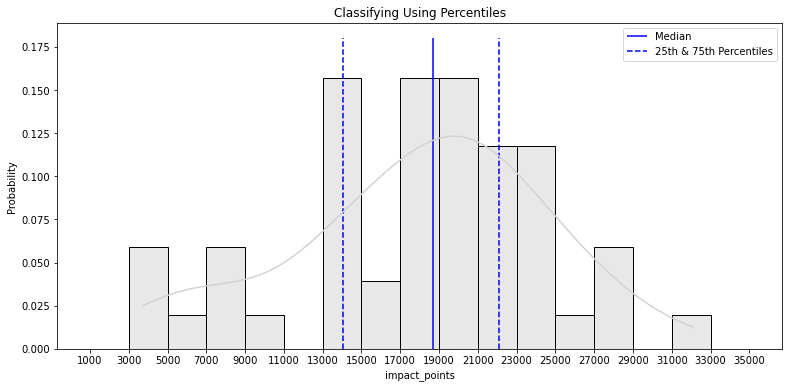

In [138]:
#explore classifying using percentiles
plt.figure(figsize=(13,6))
sns.histplot(states_df['impact_points'], kde=True, color='lightgrey', stat='probability',
             binwidth=2000, binrange=[1000,35000])
plt.vlines(x=median, ymin=0, ymax=.18, color='blue', label='Median')
plt.vlines(x=[q1, q3], ymin=0, ymax=.18, color='blue', label='25th & 75th Percentiles', linestyles='dashed')

plt.xticks(np.linspace(1000,35000,18))
plt.legend()
plt.title('Classifying Using Percentiles');

Defining categories by percentiles would group states such that 50% of states are considered "average," 25% of states are considered "high impact," and 25% of states are considered "low impact." In this approach, classes are evenly sorted. This is beneficial for modeling purposes, but may not draw realistic boundaries between Average-High and Low-Average. I reject this approach because it's reasonable to believe that the categories will naturally be imbalanced.

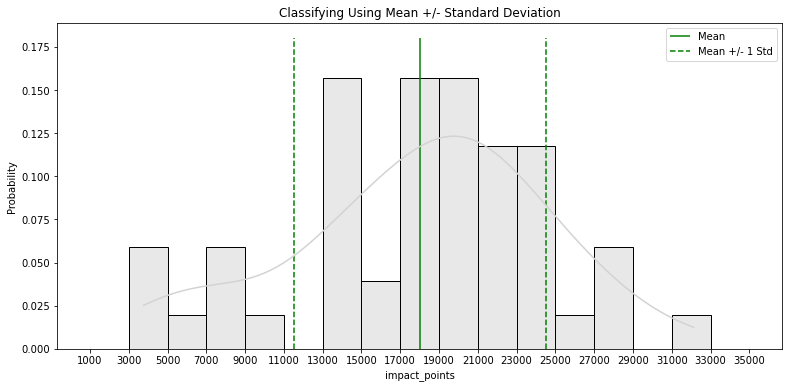

In [139]:
#explore classifying using mean +/- standard deviation
plt.figure(figsize=(13,6))
sns.histplot(states_df['impact_points'], kde=True, color='lightgrey', stat='probability',
             binwidth=2000, binrange=[1000,35000])

plt.vlines(x=mean, ymin=0, ymax=.18, color='green', label='Mean')
plt.vlines(x=[mean+std, mean-std], ymin=0, ymax=.18, color='green', 
           label='Mean +/- 1 Std', linestyles='dashed')

plt.xticks(np.linspace(1000,35000,18))
plt.legend()
plt.title('Classifying Using Mean +/- Standard Deviation');

Creating classes using the mean or median +/- standard deviations would use the distribution to calculate mean and standard deviation, but would draw boundaries between categories based on the point range rather than how the states are distributed within that range. This would allow for outliers or tails present in the distribution to be reflected as class imbalances.

+/- one standard deviation means 68.5% of the range of impact points are assigned as "average." This seems a bit high for defining "average," so let's look at a few scenarios using somewhere between .5-.8 of a standard deviation would look like.

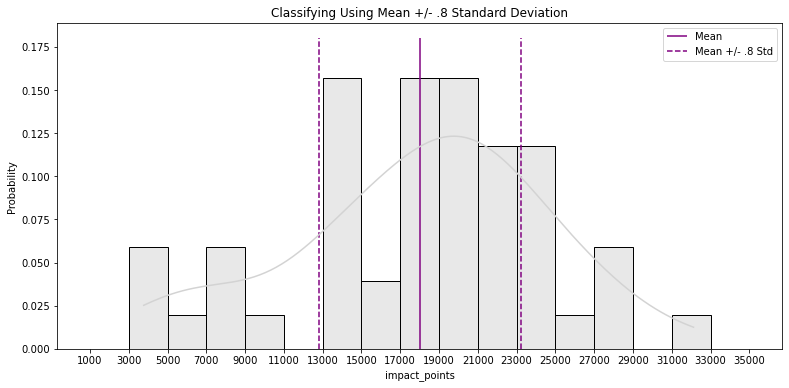

In [140]:
#explore classifying using mean +/- part of a standard deviation
plt.figure(figsize=(13,6))
sns.histplot(states_df['impact_points'], kde=True, color='lightgrey', stat='probability',
             binwidth=2000, binrange=[1000,35000])

plt.vlines(x=mean, ymin=0, ymax=.18, color='purple', label='Mean')
plt.vlines(x=[mean+(.8*std), mean-(.8*std)], ymin=0, ymax=.18, color='purple', 
           label='Mean +/- .8 Std', linestyles='dashed')

plt.xticks(np.linspace(1000,35000,18))
plt.legend()
plt.title('Classifying Using Mean +/- .8 Standard Deviation');

I feel most comfortable moving forward defining classes using .8 of a standard deviation.

In [141]:
def impact_category(df, col_name):
    '''
    Classifies numeric values into three categories of impact.
    
    Inputs:
    df - pd.DataFrame that is the source of data and destination of calculated field
    col_name = str, name of the column to segment. Must contain numeric values.
    
    Outputs:
    df with new "impact_category" column
    '''
    mean = df[col_name].mean()
    std = df[col_name].std()
    
    for i in range(0, len(df)):
        if df.loc[i, col_name] > mean+.8*std:
            df.loc[i, 'impact_category'] = '2-High'
            df.loc[i, 'impact_category_code'] = 2
        elif df.loc[i, col_name] < mean-.8*std:
            df.loc[i, 'impact_category'] = '0-Low'
            df.loc[i, 'impact_category_code'] = 0
        else:
            df.loc[i, 'impact_category'] = '1-Average'
            df.loc[i, 'impact_category_code'] = 1
    return df

In [142]:
impact_category(states_df, 'impact_points')

,State,cases,deaths,CVAC level of concern for vaccination rollout,Percent Hispanic,Percent American Indian Alaska Native,Percent Asian,Percent Black,Percent Native Hawaiian Pacific Islander,Percent White,% Hesitant or Strongly Vaccine Hesitant,AREA_SQMI,population,housing units count,households count,population density (pop per sqmi),per capita income,poverty rate,unemployment rate,% adults without hs diploma,% population >65,% population <17,SVI socioeconomic ranking,SVI household composition and disability ranking,SVI minority status and language ranking,SVI housing type and transportation ranking,SVI overall ranking,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Income inequality,Air pollution,Drinking water violations,Percent rural,cases per 100k,deaths per 100k,Percent of cases resulting in death,impact_points,impact_category,impact_category_code
0,ALABAMA,551298,11358.0,0.7201,0.0349,0.0057,0.0071,0.2874,0.0003,0.6484,0.3059,50646,4864680,2244462,1860269,96.05,23072.84,20.34,8.04,17.79,17.77,22.10,0.76,0.65,0.56,0.53,0.70,10948.4586,0.2463,4.9828,5.3784,0.2292,0.3824,0.3185,0.1423,5853.2537,0.4034,74.6871,0.1256,2857.0149,6.6657,0.1772,0.7164,0.6912,5.2733,9.3254,0.1045,0.6709,11332,233,2.060229,24786.6123,2-High,2.0
1,ALASKA,70774,360.0,0.7445,0.0531,0.3246,0.0539,0.0133,0.0053,0.4787,0.3743,570982,738516,315386,253462,1.29,32531.21,13.32,9.41,9.79,11.80,24.54,0.39,0.37,0.69,0.82,0.56,9636.3187,0.1984,4.7529,4.5961,0.2416,0.3309,0.2248,0.1910,3926.2000,0.2907,78.0034,0.1672,1389.3350,6.1400,0.1523,0.6499,0.7669,4.3408,7.7602,0.6000,0.6748,9583,48,0.508661,4947.7492,0-Low,0.0
2,ARIZONA,897910,18000.0,0.9013,0.3134,0.1332,0.0133,0.0184,0.0012,0.5020,0.2806,113590,6946685,2970935,2524300,61.16,23459.40,20.00,8.71,15.95,20.07,23.15,0.75,0.65,0.89,0.80,0.85,9430.6955,0.2253,4.8228,4.6237,0.1936,0.3080,0.2429,0.1882,3036.3333,0.3867,78.5729,0.1408,2253.3350,6.1867,0.1575,0.6811,0.7429,4.7724,6.8333,0.6667,0.3411,12925,259,2.004655,27467.7863,2-High,2.0
3,ARKANSAS,352095,5926.0,0.6448,0.0526,0.0055,0.0067,0.1607,0.0012,0.7519,0.3520,52034,2990671,1362040,1152175,57.47,22442.73,19.83,6.45,16.18,19.02,22.60,0.73,0.77,0.48,0.58,0.72,10529.4473,0.2633,5.3736,5.2683,0.2503,0.3634,0.3370,0.1590,5211.5067,0.4284,75.0073,0.0971,3247.6529,6.2533,0.1824,0.6975,0.6722,4.7950,9.0413,0.5333,0.6487,11773,198,1.683068,20814.5080,1-Average,1.0
4,CALIFORNIA,3824416,63715.0,0.6333,0.3062,0.0177,0.0731,0.0298,0.0028,0.5374,0.1081,155793,39148760,14084824,12965435,251.29,32089.62,15.02,7.40,15.59,17.07,22.24,0.53,0.39,0.85,0.69,0.63,6991.0434,0.1919,4.4497,4.5085,0.1494,0.2717,0.2104,0.2090,3210.9310,0.4105,80.4688,0.0789,1796.8151,7.9121,0.1191,0.6214,0.8344,4.7325,8.5672,0.6897,0.2870,9768,162,1.666006,17083.2255,1-Average,1.0
5,COLORADO,563067,6971.0,0.3486,0.2013,0.0089,0.0114,0.0143,0.0009,0.7435,0.1255,103638,5531141,2352202,2113387,53.37,30695.41,13.06,5.14,9.15,18.27,20.75,0.35,0.33,0.66,0.45,0.40,7074.0421,0.1584,3.6940,3.9439,0.1757,0.2458,0.1867,0.2073,2761.7833,0.4195,81.0364,0.1062,1885.4501,7.8800,0.1106,0.6995,0.8118,4.2679,5.2583,0.6667,0.5592,10179,126,1.238041,13069.9982,1-Average,1.0
6,CONNECTICUT,349651,8279.0,0.0312,0.1202,0.0017,0.0373,0.0654,0.0002,0.7512,0.0885,4842,3581504,1512305,1367374,739.57,41021.25,9.16,6.01,8.57,16.86,20.00,0.22,0.12,0.72,0.52,0.32,5979.0852,0.1293,3.4181,3.9731,0.1453,0.2731,0.1996,0.2076,4153.2500,0.5625,80.5292,0.0549,1515.8099,8.2750,0.1076,0.6877,0.8588,4.7762,7.1875,0.8750,0.2417,9762,231,2.367790,24755.2402,2-High,2.0
7,DELAWARE,109900,1695.0,0.2000,0.0873,0.0035,0.0289,0.2049,0.0004,0.6466,0.0942,1948,949495,428251,357765,487.36,32643.33,12.23,5.70,11.23,19.03,21.33,0.35,0.36,0.80,0.61,0.50,8029.3712,0.1884,4.1500

In [143]:
#sort states by impact points, lowest to highest
states_df = states_df.copy().sort_values('impact_points')

Let's take a look at the distribution of classes.

In [144]:
px.bar(states_df, 'impact_category', hover_data=['State'], 
       title='Pandemic Impact Categories',
       labels={'impact_category': 'Impact Category', 'count': 'Number of States'})

# Data Visualization

In the next few cells, I'll explore correlations between various featurs and the impact of the pandemic on each state. I'll also plot each feature as a color-coded US state map and observe trends by geographic region.

In [145]:
plot_df = states_df.sort_values('impact_points')

#plot two subplots sharing x-axis
fig = make_subplots(rows=4, cols=1, shared_xaxes=True,  
                    subplot_titles=['Cases per 100k', 'Deaths per 100k', 
                                    'COVID-19 Mortality (deaths/cases)', 
                                    'Calculated Impact Points'],
                    vertical_spacing=.1)

#plot cases per 100k on the first row
fig.add_bar(x=plot_df['State'], 
            y=plot_df['cases per 100k'], 
            row=1, col=1, 
            name='Cases per 100k', 
            marker=dict(color="rebeccapurple"))

#plot deaths per 100k on the second row
fig.add_bar(x=plot_df['State'], 
            y=plot_df['deaths per 100k'],
            row=2, col=1, 
            name='Deaths per 100k', 
            marker=dict(color="cornflowerblue"))

#plot mortality on third row
fig.add_bar(x=plot_df['State'], 
            y=plot_df['Percent of cases resulting in death'],
            row=3, col=1, name='COVID-19 Mortality (deaths/cases)', 
            marker=dict(color="darkslateblue"))

#plot impact points on fourth row
fig.add_bar(x=plot_df['State'], 
            y=plot_df['impact_points'],
            row=4, col=1, name='Calculated Impact Points (mortality*(1*cases + 3*deaths)', 
            marker=dict(color="cadetblue"))

#update title and size
fig.update_layout(height=800, width=1000, title='Population-Controlled COVID-19 Cases and Deaths',
                 showlegend=False)

#format x-axis labels
fig.update_xaxes(row=4, col=1, tickangle=45, tickfont_size=10)

#format y-axis labels
fig.update_yaxes(tickfont_size=10)

#save image
fig.write_image('./images/cases, deaths, mortality, and impact points.jpg')

fig.show()

In [146]:
#initialize a list of predictor features in order to loop through them
cols = list(states_df.columns)
#drop targets from the feature list
cols.remove('State')
cols.remove('impact_category')
cols.remove('impact_points')
cols.remove('impact_category_code')
#drop raw case and death counts in favor of the population-controlled features
cols.remove('cases')
cols.remove('deaths')

## Box Plots - Feature Distributions for Low & High Impact States

Box plots show the overall distribution of data. Box plots with a color argument passed will show the distribution of groups within the overall dataset.

Below I'll visualize box plots of the distribution of each feature, split by low impact states and high impact states. The box plot will show if those two categories have significantly different distributions.

In [147]:
#for each column, save and show a box plot with high and low pandemic impact categories
for col in cols:
    name = f'{col.title()}'
    fig = px.box(states_df[states_df['impact_category'] != '1-Average'], 
                 x='impact_category', 
                 y=col, 
                 color='impact_category', 
                 color_discrete_map={'2-High':'red', '0-Low':'blue'},
                 labels={'impact_category': 'Impact Category'})
    fig.update_layout(height=500, width=600, title_text=name)
    fig.write_image(f'./images/boxplot_{col}_impactcat.jpg')
    fig.show()

Box plot observations:

**States with high pandemic impact...**

Demographics 
- ...have a larger black population
- ...have higher population and population density

Socioeconomics
- ...have higher poverty and unemployment rates, 
- ...have greater income inequality
- ...have a larger percentage of adults with low education achievement

Health Outcomes
- ...have greater number of premature deaths 
- ...have more preventable hospital stays 
- ...have more people per primary care physician

Healthy Behaviors
- ...have populations that are more likely to smoke and less likely to be physically active

Living Conditions
- ...have lower prevalence of broadband access 
- ...have more air pollution



## Scatterplots with Trendlines

Scatterplots with impact points on the x-axis will show possible linear correlations between a feature and pandemic impact. Features with observed correlations will likely help classification models make better predictions and represent the factors that may have a causal relationship with how a community is impacted by a pandemic.

In [148]:
#for each column, plot and save a scatter plot with x=impact_points
for col in cols:
    fig = px.scatter(states_df, x='impact_points', y=col, trendline='ols', title=col, 
                     trendline_color_override='black', hover_data=['State'])
    fig.update_layout(height=500, width=600)
    fig.write_image(f'images/scatter_{col}.jpg')
    fig.show()

Aside from the features used to calculate impact points, the following features appear to be correlated with impact of the pandemic:

- Poverty Rate
- Unemployment Rate
- Education (adults without hs diploma)
- Social Vulnerability Index scores - particularly socioeconomic and minority status & language
- Premature Deaths
- Population with Poor or Fair Health
- Physical Inactivity
- Preventable Hospital Stays
- Flu Vaccinations
- Life Expectancy
- Ratio of Population to Primary Care Physicians
- Broadband Access
- Air Pollution

## Choropleth Maps

Choropleth maps will also be helpful visualizations. Plotly's choropleth map has a built-in US states location mode which takes state abbreviations, so I'll need to add that back into my dataframe. This location mode does not require a geojson file.

In [149]:
#initialize and fill a dictionary opposite of what I used earlier
abbr_dict2 = {}
for i in range(0,len(abbr)):
    d = {abbr.State[i].upper(): abbr.Code[i]}
    abbr_dict2.update(d)
abbr_dict2

{'ALABAMA': 'AL',
 'ALASKA': 'AK',
 'ARIZONA': 'AZ',
 'ARKANSAS': 'AR',
 'CALIFORNIA': 'CA',
 'COLORADO': 'CO',
 'CONNECTICUT': 'CT',
 'DELAWARE': 'DE',
 'DISTRICT OF COLUMBIA': 'DC',
 'FLORIDA': 'FL',
 'GEORGIA': 'GA',
 'HAWAII': 'HI',
 'IDAHO': 'ID',
 'ILLINOIS': 'IL',
 'INDIANA': 'IN',
 'IOWA': 'IA',
 'KANSAS': 'KS',
 'KENTUCKY': 'KY',
 'LOUISIANA': 'LA',
 'MAINE': 'ME',
 'MARYLAND': 'MD',
 'MASSACHUSETTS': 'MA',
 'MICHIGAN': 'MI',
 'MINNESOTA': 'MN',
 'MISSISSIPPI': 'MS',
 'MISSOURI': 'MO',
 'MONTANA': 'MT',
 'NEBRASKA': 'NE',
 'NEVADA': 'NV',
 'NEW HAMPSHIRE': 'NH',
 'NEW JERSEY': 'NJ',
 'NEW MEXICO': 'NM',
 'NEW YORK': 'NY',
 'NORTH CAROLINA': 'NC',
 'NORTH DAKOTA': 'ND',
 'OHIO': 'OH',
 'OKLAHOMA': 'OK',
 'OREGON': 'OR',
 'PENNSYLVANIA': 'PA',
 'RHODE ISLAND': 'RI',
 'SOUTH CAROLINA': 'SC',
 'SOUTH DAKOTA': 'SD',
 'TENNESSEE': 'TN',
 'TEXAS': 'TX',
 'UTAH': 'UT',
 'VERMONT': 'VT',
 'VIRGINIA': 'VA',
 'WASHINGTON': 'WA',
 'WEST VIRGINIA': 'WV',
 'WISCONSIN': 'WI',
 'WYOMING': 'WY

In [150]:
# replace full state names with abbreviations
states_df['state_abbr'] = states_df.State.replace(abbr_dict2)

In [151]:
states_df.head()

,State,cases,deaths,CVAC level of concern for vaccination rollout,Percent Hispanic,Percent American Indian Alaska Native,Percent Asian,Percent Black,Percent Native Hawaiian Pacific Islander,Percent White,% Hesitant or Strongly Vaccine Hesitant,AREA_SQMI,population,housing units count,households count,population density (pop per sqmi),per capita income,poverty rate,unemployment rate,% adults without hs diploma,% population >65,% population <17,SVI socioeconomic ranking,SVI household composition and disability ranking,SVI minority status and language ranking,SVI housing type and transportation ranking,SVI overall ranking,Premature death,Poor or fair health,Poor physical health days,Poor mental health days,Adult smoking,Adult obesity,Physical inactivity,Excessive drinking,Preventable hospital stays,Flu vaccinations,Life expectancy,Percent uninsured,Ratio of population to PCPs,Food environment index,Food insecurity,Homeownership,Broadband access,Income inequality,Air pollution,Drinking water violations,Percent rural,cases per 100k,deaths per 100k,Percent of cases resulting in death,impact_points,impact_category,impact_category_code,state_abbr
11,HAWAII,36680,515.0,0.3260,0.0960,0.0047,0.2893,0.0134,0.1314,0.2623,0.0912,6422,1422029,539053,456782,221.42,35526.00,10.82,3.72,9.02,17.58,18.54,0.18,0.15,0.95,0.61,0.41,6185.0450,0.1613,3.6530,3.8644,0.1637,0.2460,0.1898,0.2339,2082.5000,0.4125,82.0065,0.0531,1230.7983,7.8500,0.1085,0.6204,0.8317,4.4691,6.9750,0.0000,0.1657,2579,36,1.404035,3772.6418,0-Low,0.0,HI
45,VERMONT,24433,258.0,0.1971,0.0181,0.0035,0.0099,0.0094,0.0004,0.9389,0.0620,9217,624977,333013,259589,67.80,31966.00,11.27,4.24,8.21,19.46,19.01,0.20,0.31,0.18,0.46,0.20,6774.5357,0.1393,3.8469,4.5565,0.1681,0.2828,0.2036,0.2158,3447.4286,0.4671,79.4099,0.0509,1539.0478,8.3429,0.1086,0.7435,0.8000,4.3180,5.4214,0.5000,0.7537,3909,41,1.055949,4257.5861,0-Low,0.0,VT
1,ALASKA,70774,360.0,0.7445,0.0531,0.3246,0.0539,0.0133,0.0053,0.4787,0.3743,570982,738516,315386,253462,1.29,32531.21,13.32,9.41,9.79,11.80,24.54,0.39,0.37,0.69,0.82,0.56,9636.3187,0.1984,4.7529,4.5961,0.2416,0.3309,0.2248,0.1910,3926.2000,0.2907,78.0034,0.1672,1389.3350,6.1400,0.1523,0.6499,0.7669,4.3408,7.7602,0.6000,0.6748,9583,48,0.508661,4947.7492,0-Low,0.0,AK
19,MAINE,69118,860.0,0.3119,0.0155,0.0081,0.0079,0.0084,0.0003,0.9400,0.1743,30844,1332813,739077,556955,43.21,28983.25,13.78,5.22,8.36,21.12,18.76,0.35,0.45,0.19,0.50,0.33,7381.4989,0.1720,4.2104,4.8363,0.2056,0.3087,0.2210,0.2138,3482.1250,0.4331,78.3590,0.1136,1185.7795,7.8375,0.1352,0.7466,0.7950,4.4482,6.4125,0.5625,0.7419,5185,64,1.244249,6690.3267,0-Low,0.0,ME
37,OREGON,209561,2812.0,0.5294,0.1210,0.0165,0.0168,0.0073,0.0033,0.8030,0.1977,95987,4081943,1750539,1591835,42.53,27690.11,15.25,6.82,11.11,21.07,20.75,0.51,0.56,0.58,0.70,0.60,6915.3168,0.1946,4.8098,5.0737,0.1941,0.3224,0.2132,0.2058,2634.1176,0.3968,79.1716,0.0911,1559.4675,7.4059,0.1308,0.6591,0.8149,4.3304,6.5618,0.6176,0.4110,5133,68,1.341853,7161.4680,0-Low,0.0,OR


In [152]:
def us_states_mapplot(df, color, contin=True, title=None, hover_data=None, save=False, 
                      color_sequence='Dark2', color_map=None):
    '''
    US map color-coded by state by given feature
    
    Inputs:
    df - pd.DataFrame containing source data. Must contain a column called 'state_abbr' containing the 
            two-letter abbreviations for each state.
    color - str, column by which to color-code
    contin (default=True) - boolean, whether or not the color feature is continuous. 
                            False indicates discrete values
    title (default=None) - str, title for graph
    hover_data (default=None) - list, columns in df to display when hovering over a state
    save (default=False) - boolean, whether or not to save the image as a file in 'images' folder
    color_sequence (default='Dark2') - str or list, if contin=False, colors for discrete values 
                                       in format ['color1', 'color2', 'color n']
    color_map (default=None) - dict, if contin=False, colors for discrete values in format {'value': 'color'}
    
    Outputs:
    Plotly choropleth map and optional saved image
    '''
    if contin == True:
        
        fig = px.choropleth(data_frame=df, locations=df['state_abbr'], locationmode='USA-states', 
                            scope='usa', color=color, color_continuous_scale='balance', 
                            hover_data=hover_data, title=title)
    else:
        fig = px.choropleth(data_frame=df, locations=df['state_abbr'], locationmode='USA-states', 
                            scope='usa', hover_data=hover_data, title=title,
                            color=color, color_discrete_sequence=color_sequence, color_discrete_map=color_map)
        
    if save == True:
        fig.write_image(f'images/map_{title}.jpg')
    fig.show()

In [153]:
#map impact points
title = 'Impact of COVID-19 Pandemic by State - Points'
hover_data=['State', 'impact_category', 'cases per 100k', 'deaths per 100k']

us_states_mapplot(states_df, 'impact_points', hover_data=hover_data, title=title, save=True)

In [154]:
#map impact category
title='Impact of COVID-19 Pandemic by State - Category'
color_map={'0-Low': 'darkslateblue', '1-Average': 'linen', '2-High': 'brown'}

us_states_mapplot(states_df, 'impact_category', contin=False, color_map=color_map, title=title, save=True)

In [155]:
# print the high impact states and low impact states
high = list(states_df.State[states_df['impact_category'] == '2-High'])
high_title = []
for item in high:
    high_title.append(item.title())
print(f'High-Impact States: {high_title}')

low = list(states_df.State[states_df['impact_category'] == '0-Low'])
low_title = []
for item in low:
    low_title.append(item.title())
print(f'Low-Impact States: {low_title}')

High-Impact States: ['Louisiana', 'South Dakota', 'Connecticut', 'Alabama', 'Mississippi', 'Rhode Island', 'Arizona', 'Massachusetts', 'New Jersey']
Low-Impact States: ['Hawaii', 'Vermont', 'Alaska', 'Maine', 'Oregon', 'Utah', 'Washington', 'New Hampshire']


In [156]:
high = list(states_df.State[states_df['impact_category'] == '2-High'])
high_title = []
for item in high:
    high_title.append(item.title())
high_title

['Louisiana',
 'South Dakota',
 'Connecticut',
 'Alabama',
 'Mississippi',
 'Rhode Island',
 'Arizona',
 'Massachusetts',
 'New Jersey']

In [157]:
#map all other features, review and observe findings
for col in cols:
    name = f'{col.title()}'
    us_states_mapplot(states_df, col, title=name, hover_data=hover_data, save=True)

Map observations:
- The midwest and northeast have low concern for vaccination rollout and low social vulnerability compared to the west and south
- Vaccine hesitancy is concentrated in the south, Montana/Idaho/Wyoming, and Alaska. The same areas have the highest % population uninsured.
- The south has higher poverty rates, and the south and west have higher unemployment and lower education than elsewhere in the country
- The south has significantly higher rates of poor/fair health, more preventable hospital stays, higher prevalence of smoking, obesity, and physical activity, and lower life expectancy by up to 7 years than elsewhere in the country



# Save Dataset

I'll now save the merged dataset with engineered features as a csv file and move into a different notebook for modeling so that I can update either the modeling data or the modeling workflow separately without breaking the other.

In [158]:
states_df.to_csv('data/merged_state_level_dataset.csv', index=False)

# Appendix

In [159]:
states_df['cases'].sum()

33471979

In [160]:
states_df['deaths'].sum()

592400.0

In [161]:
states_df['Percent of cases resulting in death'].mean()

1.6582224417714722